<h1 style = 'text-align: center;'>Tuwaiq Academy</h1>
<h1 style = 'text-align: center;'>Data Science and Machine Learning Bootcamp</h1>
<h2 style = 'text-align: center;'>Usecase 3 - Project 2: World University Rankings</h2>

# Introudction
University rankings are difficult to determine because different universities and ranking systems use varying factors to measure success. But why is ranking universities important? That depends on what matters to each person. So, why should you consider university rankings before enrolling? Don’t worry. This isn’t a pop quiz! Any reason that matters to you is valid.

Here, we are considering three different ranking systems: Shanghai Ranking, Times Higher Education Ranking, and Center World University Ranking, to answer the following questions:

1. Which universities are ranked in the top 10 globally?
2. Which universities are ranked in the top 10 for employment outcomes?
3. What positions do universities in Saudi Arabia hold within the global rankings?
4. Considering various factors such as employment rankings, research rankings, and others, which has the most significant impact on a university's overall ranking?
5. Is there a correlation between national and global university rankings, and based on this information, can you recommend a country that appears to have a high concentration of top-ranked universities?
6. **Bonus:** Are there any universities that have stayed in the same position in both 2022 and 2023?
7. **Bonus:** Which university experienced the most significant decline in its global ranking from 2022 to 2023?


## The Academic Ranking of World Universities (ARWU)
ARWU AKA Shanghai Ranking uses six objective indicators to rank world universities, including:
- the number of alumni of an institution winning Nobel Prizes and Fields Medals with weight 10%.
- the number of staff of an institution winning Nobel Prizes and Fields Medals with weight 20%.
- the number of highly cited researchers selected by Clarivate with weight 20%.
- the number of articles published in journals of Nature and Science with weight 20%.
- The number of articles indexed in Science Citation Index Expanded™ and Social Sciences Citation Index™ in the Web of Science™ with weigh 20%.
- Per capita academic performance of a university with weight 10%.
More than 2500 universities are actually ranked by ARWU every year and the best 1000 are published.

## Times Higher Education Ranking
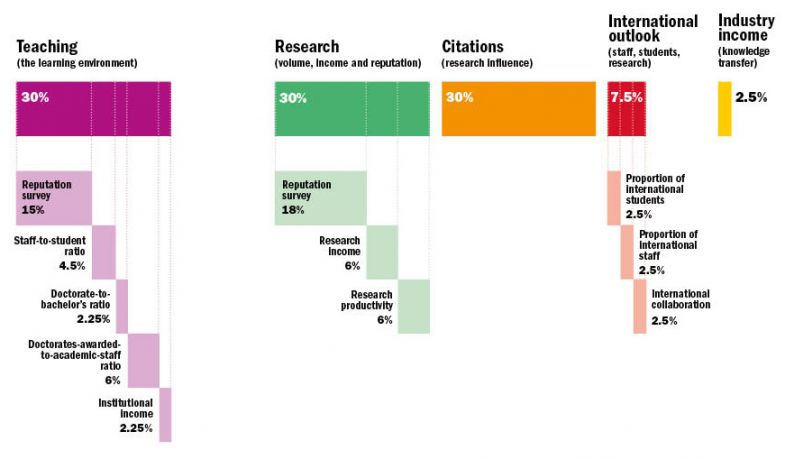
## Center for World University Ranking (CWUR)
Since 2012, CWUR has been publishing the only academic ranking of global universities that assesses the quality of education, employability, quality of faculty, and research without relying on surveys and university data submissions. The ranking started out as a project in **Jeddah, Saudi Arabia** with the aim of rating the top 100 world universities. It was quickly reported worldwide by universities and the media and many requests were received to expand it. In 2019, the ranking expanded to list the top 2000 out of nearly twenty thousand universities worldwide, making it **the largest academic ranking of global universities.**

CWUR uses seven objective and robust indicators grouped into four areas to rank the world’s universities:

1) Education: based on the academic success of a university’s alumni, measured relative to the university's size (25%)
2) Employability: based on the professional success of a university’s alumni, measured relative to the university's size (25%)
3) Faculty: measured by the number of faculty members who have received top academic distinctions (10%)
4) Research:
i) Research Output: measured by the total number of research articles (10%)
ii) High-Quality Publications: measured by the number of research articles appearing in top-tier journals (10%)
iii) Influence: measured by the number of research articles appearing in highly-influential journals (10%)
iv) Citations: measured by the number of highly-cited research articles (10%)

In [385]:
#Import important necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import re
 
## This statement allows the visuals to render within your Jupyter Notebook.
%matplotlib inline

## Loading the data
We can now load the dataset into pandas using the read_csv() function. This converts the CSV file into a Pandas dataframe.

In [386]:
#Read in the csv file and convert to a Pandas dataframe
# Shanghai University Ranking 2022 - 2023
shanghai2022=pd.read_excel("Data/shanghai Ranking.xlsx") # 2022
shanghai2023=pd.read_csv("Data/shanghai-ranking_2023.csv") # 2023

# Times Higher Education University Ranking 2022 - 2023
the2022=pd.read_csv("Data/THE2022.csv") # 2022
the2023=pd.read_csv("Data/THE2023.csv") # 2023

# Center for World University Ranking 2022 - 2023
cwur2022=pd.read_csv("Data/WORLD UNIVERSITY RANKINGS.csv") # 2022
cwur2023=pd.read_excel("Data/Word Rank University.xlsx") # 2023


### Viewing the dataframe
We can get a quick sense of the size of our dataset by using the shape method. This returns a tuple with the number of rows and columns in the dataset.

### Shape 2022

In [206]:
print("Shaghai dataset's shape:",shanghai2022.shape)
print("Times Higher Education dataset's shape:",the2022.shape)
print("The CWUR dataset's shape:", cwur2022.shape)

Shaghai dataset's shape: (1000, 6)
Times Higher Education dataset's shape: (2112, 24)
The CWUR dataset's shape: (2000, 9)


### Shape 2023

In [207]:
print("Shaghai dataset's shape:",shanghai2023.shape)
print("Times Higher Education dataset's shape:",the2023.shape)
print("The CWUR dataset's shape:", cwur2023.shape)

Shaghai dataset's shape: (1000, 19)
Times Higher Education dataset's shape: (2345, 24)
The CWUR dataset's shape: (2000, 9)


## 1. Data Profiling:
Data profiling is a comprehensive process of examining the data available in an existing dataset and collecting statistics and information about that data. 

### Shangahi Ranking 2022

#### Information of Features
- Ranking : it's based on the globle scope.
- University Name: the name of the university.
- National/Regional Rank: it's based on the country's scope.
- Total Score: the score of the university.
- Logo: logo of the university.
- University Detail: shows details about a university.


In [208]:
# Checking the first 5 rows of the datasets
shanghai2022.head()

,Ranking,University Name,National/Regional Rank,Total Score,LOGO,University Detail
0,1,Harvard University,1,100.0,http://www.shanghairanking.com/_uni/logo/032bd...,http://www.shanghairanking.com/institution/har...
1,2,Stanford University,2,76.8,http://www.shanghairanking.com/_uni/logo/13de8...,http://www.shanghairanking.com/institution/sta...
2,3,Massachusetts Institute of Technology (MIT),3,70.1,http://www.shanghairanking.com/_uni/logo/79165...,http://www.shanghairanking.com/institution/mas...
3,4,University of Cambridge,1,69.6,http://www.shanghairanking.com/_uni/logo/8d986...,http://www.shanghairanking.com/institution/uni...
4,5,"University of California, Berkeley",4,65.3,http://www.shanghairanking.com/_uni/logo/0ff17...,http://www.shanghairanking.com/institution/uni...


We notice that:
- there are 93 unique ranks out of 1000 ranks which means there are duplicated ranks.
- the university name are all unique and the top one is Harvard University.
- there are 138 unique national/regional rank out of 1000 ranks which means there are duplicated ranks.
- there are 928 countries out of 1000 countries which mean there are missing values.
- there 60 unique countries out of 928 which means there are duplicated countries (normal case).
- The top country is United States with frequency of 183 (mode).

In [209]:
shanghai2022.describe(include='object')

,Ranking,University Name,National/Regional Rank,LOGO,University Detail
count,1000,1000,1000,1000,1000
unique,93,1000,136,1000,1000
top,901-1000,Harvard University,1,http://www.shanghairanking.com/_uni/logo/032bd...,http://www.shanghairanking.com/institution/har...
freq,100,1,59,1,1


We notice that: 
- There are no nulls.
- The ranking is object, not int.

In [210]:
# Checking the dataset info
shanghai2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Ranking                 1000 non-null   object 
 1   University Name         1000 non-null   object 
 2   National/Regional Rank  1000 non-null   object 
 3   Total Score             1000 non-null   float64
 4   LOGO                    1000 non-null   object 
 5   University Detail       1000 non-null   object 
dtypes: float64(1), object(5)
memory usage: 47.0+ KB


### Shanghai Ranking 2023

#### Information of Features
- Rank: rank of the university.
- Logo: logo of the university.
- Name: name of the university.
- Link: shows a link to university details including: its best subjects' ranks and some key statistics.
- website: shows a link to the website of the university.
- Flag: shows the flag of the country of the university.
- Country: shows the country of the university.
- Region: shows the continent of the country of the university.
- Foundation year: shows the year when the university was established.
- Adress: shows the address of the university.
- Total enrollment: shows the total number of enrolled students in the university.
- Total International Enrollment: shows the total number of enrolled international students in the university.
- UG_Entollment: shows the number of enrolled undergradute students.
- International_UG_Enrollment: shows the percentage of enrolled international undergraduate students out of the number of enrolled undergraduate students.
- PG_Enrollment: shows the number of enrolled post-graduate students in the university.
- International_PG_Enrollment: shows the percentage of enrolled international post-graduate students out of the number of enrolled post-graduate students.
- latitude: shows the north-south position in decimal degrees.
- longitude: shows the the east-west position in decimal degrees.

In [211]:
# Checking the first 5 rows of the datasets
shanghai2023.head()

,Rank,Logo,Name,Link,Website,Flag,Country,Region,Foundation_year,Address,Intro,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment,latitude,longitude
0,1,https://www.shanghairanking.com/_uni/logo/032b...,Harvard University,https://www.shanghairanking.com/institution/ha...,http://www.harvard.edu,https://www.shanghairanking.com/_pub/country-f...,United States,North America,1636,"Harvard University, Cambridge, Massachusetts ...",Harvard University is devoted to excellence in...,41987,24.0,14467,10.1,27520,20.1,42.367909,-71.126782
1,2,https://www.shanghairanking.com/_uni/logo/13de...,Stanford University,https://www.shanghairanking.com/institution/st...,http://www.stanford.edu,https://www.shanghairanking.com/_pub/country-f...,United States,North America,1885,450 Serra Mall,Stanford University is a research university t...,16163,24.0,6994,10.7,9169,34.2,37.431314,-122.169365
2,3,https://www.shanghairanking.com/_uni/logo/7916...,Massachusetts Institute of Technology (MIT),https://www.shanghairanking.com/institution/ma...,http://web.mit.edu/,https://www.shanghairanking.com/_pub/country-f...,United States,North America,1861,77 Massachusetts Avenue,The essence of MIT is our appetite for problem...,11084,16.8,4276,14.5,6808,18.2,42.358253,-71.096627
3,4,https://www.shanghairanking.com/_uni/logo/8d98...,University of Cambridge,https://www.shanghairanking.com/institution/un...,http://www.cam.ac.uk,https://www.shanghairanking.com/_pub/country-f...,United Kingdom,Europe,1318,"The Old Schools, Trinity Lane",The University of Cambridge’s mission is to co...,19875,36.9,12265,23.3,7610,58.9,52.210946,0.092005
4,5,https://www.shanghairanking.com/_uni/logo/0ff1...,"University of California, Berkeley",https://www.shanghairanking.com/institution/un...,http://berkeley.edu/,https://www.shanghairanking.com/_pub/country-f...,United States,North America,1868,"University of California, Berkeley, Berkeley,...",Berkeley is internationally noted for its acad...,39874,17.7,29250,19.0,10624,13.9,37.875500,-122.239069


We notice that:
- there are similar insights as the previous dataset such as the rank and the name.
- Here the top country is China. In 2022 it was United States.
- the top region is Asia.

In [212]:
shanghai2023.describe(include= object)

,Rank,Logo,Name,Link,Website,Flag,Country,Region,Address,Intro
count,1000,1000,1000,1000,1000,1000,1000,1000,862,592
unique,91,979,1000,1000,1000,62,62,6,843,592
top,901-1000,https://www.shanghairanking.com/images/default...,Harvard University,https://www.shanghairanking.com/institution/ha...,http://www.harvard.edu,https://www.shanghairanking.com/_pub/country-f...,China,Asia,University Road,Harvard University is devoted to excellence in...
freq,100,22,1,1,1,191,191,356,3,1


We notice that:
- There are null values in address, intro, latitude, and longitude features.
- The rank is obejct, not int.

In [213]:
# Checking the dataset info
shanghai2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Rank                            1000 non-null   object 
 1   Logo                            1000 non-null   object 
 2   Name                            1000 non-null   object 
 3   Link                            1000 non-null   object 
 4   Website                         1000 non-null   object 
 5   Flag                            1000 non-null   object 
 6   Country                         1000 non-null   object 
 7   Region                          1000 non-null   object 
 8   Foundation_year                 1000 non-null   int64  
 9   Address                         862 non-null    object 
 10  Intro                           592 non-null    object 
 11  Total_Enrollment                1000 non-null   int64  
 12  Total_International_Enrollment  100

### Times Higher Education University Ranking 2022

### Information of Features
- rank: The rank of the university.  
- name: The name of the university.  
- scores_overall: The overall score assigned to the university based on various metrics.  
- scores_overall_rank: The university's rank based on its overall score.  
- scores_teaching: The score reflecting the quality of teaching at the university.  
- scores_teaching_rank: The university's rank based on its teaching score.  
- scores_research: The score reflecting the quality and quantity of research output.  
- scores_research_rank: The university's rank based on its research score.  
- scores_citations: The score based on the number of citations of research papers produced by the university.  
- scores_citations_rank: The university's rank based on its citations score.  
- scores_industry_income: The score reflecting the university's ability to generate income from industry.  
- scores_industry_income_rank: The university's rank based on its industry income score.  
- scores_international_outlook: The score representing the university's international diversity and collaboration.  
- scores_international_outlook_rank: The university's rank based on its international outlook score.  
- location: The geographical location of the university.  
- stats_number_students: The total number of students enrolled at the university.  
- stats_student_staff_ratio: The ratio of students to academic staff at the university.  
- stats_pc_intl_students: The percentage of international students enrolled.  
- stats_female_male_ratio: The ratio of female to male students at the university.  
- aliases: Alternative names or abbreviations for the university.  
- subjects_offered: The academic subjects or programs available at the university.  
- closed: Indicates whether the university is closed.  
- unaccredited: Indicates whether the university is unaccredited.  

In [214]:
# Checking the first 5 rows of the datasets
the2022.head()

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,...,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio,aliases,subjects_offered,closed,unaccredited
0,10,1,University of Oxford,95.7,10,91.0,5,99.6,1,98.0,...,26,United Kingdom,"20,835",10.7,42%,47 : 53,University of Oxford,"Accounting & Finance,General Engineering,Commu...",False,False
1,20,=2,California Institute of Technology,95.0,20,93.6,2,96.9,4,97.8,...,167,United States,"2,233",6.3,34%,36 : 64,California Institute of Technology caltech,"Languages, Literature & Linguistics,Economics ...",False,False
2,30,=2,Harvard University,95.0,30,94.5,1,98.9,3,99.2,...,209,United States,"21,574",9.5,24%,50 : 50,Harvard University,"Mathematics & Statistics,Civil Engineering,Lan...",False,False
3,40,4,Stanford University,94.9,40,92.3,3,96.8,5,99.9,...,211,United States,"16,319",7.3,23%,46 : 54,Stanford University,"Physics & Astronomy,Computer Science,Politics ...",False,False
4,50,=5,University of Cambridge,94.6,50,90.9,6,99.5,2,96.2,...,32,United Kingdom,"19,680",11.1,39%,47 : 53,University of Cambridge,"Business & Management,General Engineering,Art,...",False,False


We notice that:
- some similar insights as the previous datasets such as the rank, name, and location.
- there is an odd rank (1201+) with a plus sign.
- only the name feature with all of its elemnts being unique.

In [215]:
the2022.describe(include='object')

,rank,name,scores_overall,location,stats_number_students,stats_pc_intl_students,stats_female_male_ratio,aliases,subjects_offered
count,2112,2112,1662,2112,2112,2112,2033,2112,2112
unique,144,2112,143,111,2047,75,82,2112,2049
top,1201+,University of Oxford,10.6–22.3,United States,"6,344",1%,54 : 46,University of Oxford,"Medicine & Dentistry,Other Health"
freq,461,1,461,188,3,250,98,1,16


We can notice that:
- the rank is an object not an int
- there are missing values in scores_overall, scores_teaching, scores_research, scores_citations, scores_industry_income, scores_international_outlook, and stats_female_male_ratio features

In [216]:
# Checking the dataset info
the2022.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2112 entries, 0 to 2111
Data columns (total 24 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   rank_order                         2112 non-null   int64  
 1   rank                               2112 non-null   object 
 2   name                               2112 non-null   object 
 3   scores_overall                     1662 non-null   object 
 4   scores_overall_rank                2112 non-null   int64  
 5   scores_teaching                    1662 non-null   float64
 6   scores_teaching_rank               2112 non-null   int64  
 7   scores_research                    1662 non-null   float64
 8   scores_research_rank               2112 non-null   int64  
 9   scores_citations                   1662 non-null   float64
 10  scores_citations_rank              2112 non-null   int64  
 11  scores_industry_income             1662 non-null   float

### Times Higher Education University Ranking 2023

Both datasets of THE have the same features

In [217]:
# Checking the first 5 rows of the datasets
# rank order is like index start with 1 + 0 >> 10, 20 , 30 and we will consider it as index in mean time.
the2023.head()

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,...,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio,aliases,subjects_offered,closed,unaccredited
0,10,1,University of Oxford,96.4,10,92.3,5,99.7,1,99.0,...,28,United Kingdom,"20,965",10.6,42%,48 : 52,University of Oxford,"Accounting & Finance,General Engineering,Commu...",False,False
1,20,2,Harvard University,95.2,20,94.8,1,99.0,3,99.3,...,214,United States,"21,887",9.6,25%,50 : 50,Harvard University,"Mathematics & Statistics,Civil Engineering,Lan...",False,False
2,30,=3,University of Cambridge,94.8,30,90.9,7,99.5,2,97.0,...,34,United Kingdom,"20,185",11.3,39%,47 : 53,University of Cambridge,"Business & Management,General Engineering,Art,...",False,False
3,40,=3,Stanford University,94.8,40,94.2,2,96.7,7,99.8,...,223,United States,"16,164",7.1,24%,46 : 54,Stanford University,"Physics & Astronomy,Computer Science,Politics ...",False,False
4,50,5,Massachusetts Institute of Technology,94.2,50,90.7,8,93.6,11,99.8,...,119,United States,"11,415",8.2,33%,40 : 60,Massachusetts Institute of Technology,"Mathematics & Statistics,Languages, Literature...",False,False


We notice that:
- there are similar insights as the previous datasets such as the rank, the name, and the location.
- there is an odd rank that is not a number.

**Reporter rank** THE classifies the universities that didn't pass their criteria as repoter.

In [218]:
the2023.describe(include='object')

,rank,name,scores_overall,location,stats_number_students,stats_pc_intl_students,stats_female_male_ratio,aliases,subjects_offered
count,2345,2345,1799,2345,2345,2345,2255,2345,2339
unique,161,2345,160,119,2260,79,87,2345,2260
top,Reporter,University of Oxford,18.4–24.3,United States,"10,814",0%,58 : 42,University of Oxford,"Medicine & Dentistry,Other Health"
freq,546,1,305,179,3,336,101,1,22


We notice that:
- the rank is still an object, not an int.
- there are missing values in scores_overall, scores_teaching, scores_research, scores_citations, scores_industry_income, scores_international_outlook, stats_student_staff_ratio, stats_female_male_ratio,  subjects_offered features.

In [47]:
the2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2345 entries, 0 to 2344
Data columns (total 20 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   rank_order                         2345 non-null   int64  
 1   rank                               2345 non-null   object 
 2   name                               2345 non-null   object 
 3   scores_overall                     1799 non-null   object 
 4   scores_overall_rank                2345 non-null   int64  
 5   scores_teaching                    1799 non-null   float64
 6   scores_teaching_rank               2345 non-null   int64  
 7   scores_research                    1799 non-null   float64
 8   scores_research_rank               2345 non-null   int64  
 9   scores_citations                   1799 non-null   float64
 10  scores_citations_rank              2345 non-null   int64  
 11  scores_industry_income             1799 non-null   float

### Center for World University Ranking 2022

#### Inofrmation of Features
- World Rank: it is based on the global scope.
- Institution: shows the name of the university.
- Location: shows the location (country) of the university.
- National RanK: it is based on the country's scope.
- Educational Rank: this rank reflects the quality of education provided by the university, based on various metrics.
- Employability Rank	:The university's ranking based on the employability of its graduates, often influenced by industry connections and job placement rates.
- Faculty Rank:Ranking based on the qualifications and achievements of the university's faculty members.
- Research Rank:This rank indicates the university's research output and impact, including publications and citations.
- Score:The overall score assigned to the university, typically ranging from 0 to 100, reflecting its performance across various metrics.

In [21]:
# Checking the first 5 rows of the datasets
cwur2022.head()

,World Rank,Institution,Location,National Rank,Education Rank,Employability Rank,Faculty Rank,Research Rank,Score
0,1,Harvard University,USA,1,1,1,1,1,100.0
1,2,Massachusetts Institute of Technology,USA,2,4,12,2,7,96.7
2,3,Stanford University,USA,3,11,4,3,2,95.1
3,4,University of Cambridge,United Kingdom,1,3,25,4,10,94.1
4,5,University of Oxford,United Kingdom,2,7,27,9,4,93.3


We notice that:
- All the world rank are unique, but the format looks odd.
- there are some similar insights as the previous datasets such as the university name and location.
- there are some dashes in Educational, Employability, Faculty, and Reserach ranks.

In [61]:
cwur2023.describe(include='object')

,World Rank,University Names,Location,Educational Rank,Employability Rank,Faculty Rank,Research Rank
count,2000,2000,2000,2000,2000,2000,2000
unique,2000,2000,95,439,1030,262,1935
top,1Top 0.1%,Harvard University,USA,-,-,-,-
freq,1,1,332,1562,967,1727,66


### Center for World University Ranking 2023

Both datasets of CWUR have the same features

In [23]:
# Checking the first 5 rows of the datasets
# We notice here the incorrect format of the university names feature
cwur2023.head()

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score
0,1Top 0.1%,Harvard University\n CWUR Rating System: Ed...,USA,1,1,1,1,1,100.0
1,2Top 0.1%,Massachusetts Institute of Technology\n Educa...,USA,2,4,12,3,9,96.7
2,3Top 0.1%,Stanford University\n Education: A+; Employab...,USA,3,11,4,2,2,95.2
3,4Top 0.1%,University of Cambridge\n Education: A+; Empl...,United Kingdom,1,3,25,5,11,94.1
4,5Top 0.1%,University of Oxford\n Education: A+; Employa...,United Kingdom,2,7,27,9,4,93.3


In [67]:
#the same insights as the 2022 dataset.
cwur2023.describe(include='object')

,World Rank,University Names,Location,Educational Rank,Employability Rank,Faculty Rank,Research Rank
count,2000,2000,2000,2000,2000,2000,2000
unique,2000,2000,95,439,1030,262,1935
top,1Top 0.1%,Harvard University,USA,-,-,-,-
freq,1,1,332,1562,967,1727,66


### Based on the previous codes, it shows that there are some differences between the data frames, such as the number of columns, column names, and some extra or missing columns.

### Data Quality Checks
Data quality checks involve the process of ensuring that the data is accurate, complete, consistent, relevant, and reliable. 


**Here are typical steps involved in checking data quality:**

#### 1. Reliability:
Evaluate the data's source and collection process to determine its trustworthiness.

The datasets are trustworthy as we found them on Kaggle and checked their sources and the official websites of the three ranking system.


#### 2. Timeliness: 
Ensure the data is up-to-date and reflective of the current situation or the period of interest for the analysis.

As we didn't have access to 2024 and 2025 datasets, we searched for the most up-to-date datasets and found 2022-2023 datasets. Therefore, they are the most up-to-date datasets in our hands.

#### 3. Consistency: 

Confirm that the data is consistent within the dataset and across multiple data sources. For example, the same data point should not have different values in different places.


In [219]:
# Checkinf the fomat of university name in cwur2023
# fixing them in data cleaning step
cwur2023["University Names"][0]

'Harvard University\n  CWUR Rating System: \xa0 Education: A+; Employability: A+; Faculty: A+; Research: A+'

In [220]:
# Checking the format of university name  in cwur 2022
cwur2022["Institution"][0]

'Harvard University'

In [ ]:
# Shanghai 2022 lacks the country feature -> fixing it in data cleaning 

 All other Datasets is consistents and also all columns realted to each other

#### 4. Relevance: 
Assess whether the data is appropriate and applicable for the intended analysis. Data that is not relevant can skew results and lead to incorrect conclusions.

**Key considerations for relevance include:**

> 1. Sample Appropriateness: Confirm that your data sample aligns with your analysis objectives. For instance, utilizing data from the Northern region will not yield accurate insights for the Western region of the Kingdom.
>
> 2. Variable Selection: Any column will not be relevant for our analysis, we can get rid of these using the drop() method. We will set the “axis” argument to 1 since we’re dealing with columns, and set the “inplace” argument to True to make the change permanent.


The sample appropriateness is good, meaning our data aligns well with the objectives of our analysis.

### Shanghai Ranking 2022

In [221]:
# Checking Shanghai 2022 columns
shanghai2022.columns

Index(['Ranking', 'University Name', 'National/Regional Rank', 'Total Score',
       'LOGO', 'University Detail '],
      dtype='object')

### Shanghai Ranking 2023

In [223]:
# Checking Shangahi 2023 columns
# There are unecessary columns for the analysis -> dropping them in data cleaning
shanghai2023.columns

Index(['Rank', 'Logo', 'Name', 'Link', 'Website', 'Flag', 'Country', 'Region',
       'Foundation_year', 'Address', 'Intro', 'Total_Enrollment',
       'Total_International_Enrollment', 'UG_Enrollment',
       'International_UG_Enrollment', 'PG_Enrollment',
       'International_PG_Enrollment', 'latitude', 'longitude'],
      dtype='object')

In [25]:
# Checking the one linke 
shanghai2023['Link'][0]

'https://www.shanghairanking.com/institution/harvard-university'

### Times Higher Education 2022

In [31]:
# Checking THE 2022 columns
# There are unecessary columns for the analysis -> dropping them in data cleaning
the2022.columns

Index(['rank_order', 'rank', 'name', 'scores_overall', 'scores_overall_rank',
       'scores_teaching', 'scores_teaching_rank', 'scores_research',
       'scores_research_rank', 'scores_citations', 'scores_citations_rank',
       'scores_industry_income', 'scores_industry_income_rank',
       'scores_international_outlook', 'scores_international_outlook_rank',
       'location', 'stats_number_students', 'stats_student_staff_ratio',
       'stats_pc_intl_students', 'stats_female_male_ratio', 'aliases',
       'subjects_offered', 'closed', 'unaccredited'],
      dtype='object')

### Times Higher Education 2023

In [36]:
# Checking THE 2023 columns
# There are unecessary columns for the analysis -> dropping them in data cleaning
the2023.columns

Index(['rank_order', 'rank', 'name', 'scores_overall', 'scores_overall_rank',
       'scores_teaching', 'scores_teaching_rank', 'scores_research',
       'scores_research_rank', 'scores_citations', 'scores_citations_rank',
       'scores_industry_income', 'scores_industry_income_rank',
       'scores_international_outlook', 'scores_international_outlook_rank',
       'location', 'stats_number_students', 'stats_student_staff_ratio',
       'stats_pc_intl_students', 'stats_female_male_ratio', 'aliases',
       'subjects_offered', 'closed', 'unaccredited'],
      dtype='object')

In [37]:
the2023.drop(columns=['unaccredited', 'closed', 'aliases', 'subjects_offered'], inplace = True)

### Center for World University Ranking 2022

In [45]:
#All the features are necessary
cwur2022.columns

Index(['World Rank', 'Institution', 'Location', 'National Rank',
       'Education Rank', 'Employability Rank', 'Faculty Rank', 'Research Rank',
       'Score'],
      dtype='object')

In [46]:
#All the features are necessary
cwur2023.columns

Index(['World Rank', 'University Names', 'Location ', 'National Rank',
       'Educational Rank', 'Employability Rank', 'Faculty Rank',
       'Research Rank', 'Score'],
      dtype='object')

#### 5. Uniqueness: 
Check for and remove duplicate records to prevent skewed analysis results.


### Shanghai Ranking 2022

In [48]:
# Checking for duplicates in Shanghai 2022 dataset
shanghai2022.duplicated().sum() #There are no duplicated values

0

In [468]:
#Checking for duplicated ranking in ranking feature. There are some duplicated ranks, which is noraml.
shanghai2022[shanghai2022['Ranking'].duplicated(keep= False)]

,Ranking,University Name,National/Regional Rank,Total Score,LOGO,University Detail,Country,Rank_Float
40,41,Karolinska Institute,1,34.2,http://www.shanghairanking.com/_uni/logo/826ac...,http://www.shanghairanking.com/institution/kar...,Sweden,41.0
41,41,Kyoto University,2,34.2,http://www.shanghairanking.com/_uni/logo/ac21f...,http://www.shanghairanking.com/institution/kyo...,Japan,41.0
43,44,Rockefeller University,25-26,33.8,http://www.shanghairanking.com/_uni/logo/22e35...,http://www.shanghairanking.com/institution/roc...,United States,44.0
44,44,University of British Columbia,2,33.8,http://www.shanghairanking.com/_uni/logo/38ff7...,http://www.shanghairanking.com/institution/uni...,Canada,44.0
45,44,"University of Minnesota, Twin Cities",25-26,33.8,http://www.shanghairanking.com/_uni/logo/7f9e6...,http://www.shanghairanking.com/institution/uni...,United States,44.0
53,54,Shanghai Jiao Tong University,4,32.0,http://www.shanghairanking.com/_uni/logo/27403...,http://www.shanghairanking.com/institution/sha...,China,54.0
54,54,Utrecht University,1,32.0,http://www.shanghairanking.com/_uni/logo/50630...,http://www.shanghairanking.com/institution/utr...,Netherlands,54.0
56,57,"University of California, Santa Barbara",32,31.5,http://www.shanghairanking.com/_uni/logo-jpg/6...,http://www.shanghairanking.com/institution/uni...,United States,57.0
57,57,University of Munich,2,31.5,http://www.shanghairanking.com/_uni/logo/6d76d...,http://www.shanghairanking.com/institution/uni...,Germany,57.0
61,62,University of Geneva,3,30.3,http://www.shanghairanking.com/_uni/logo/7cd1d...,http://www.shanghairanking.com/institution/uni...,Switzerland,62.0


In [463]:
# Checking for duplicated values in both universty name and rnaking
shanghai2022[shanghai2022[['University Name', 'Ranking']].duplicated()]

,Ranking,University Name,National/Regional Rank,Total Score,LOGO,University Detail,Country,Rank_Float


### Shanghai Ranking 2023

In [49]:
# Checking for duplicates in Shanghai 2023 dataset
shanghai2023.duplicated().sum() # It seems there are no duplicated values

0

In [465]:
#Checking for duplicated ranking in ranking feature. There are some duplicated ranks, which is noraml.
shanghai2023[shanghai2023['Rank'].duplicated(keep= False)]

,Rank,Logo,Name,Link,Country,Region,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment,Rank_Float
34,35,https://www.shanghairanking.com/_uni/logo/741c...,The University of Melbourne,https://www.shanghairanking.com/institution/th...,Australia,Oceania,67373,38.9,30364,34.5,37009,42.5,35.0
35,35,https://www.shanghairanking.com/_uni/logo/da43...,University of Wisconsin - Madison,https://www.shanghairanking.com/institution/un...,United States,North America,41265,9.2,30540,9.4,10725,8.4,35.0
38,39,https://www.shanghairanking.com/_uni/logo/ac21...,Kyoto University,https://www.shanghairanking.com/institution/ky...,Japan,Asia,22596,9.0,19561,10.1,7793,20.1,39.0
39,39,https://www.shanghairanking.com/_uni/logo/22e3...,Rockefeller University,https://www.shanghairanking.com/institution/ro...,United States,North America,248,32.3,19561,10.1,248,32.3,39.0
40,41,https://www.shanghairanking.com/_uni/logo-jpg/...,PSL University,https://www.shanghairanking.com/institution/ps...,France,Europe,16218,15.0,4230,15.1,11988,15.0,41.0
41,41,https://www.shanghairanking.com/_uni/logo/ef5c...,The University of Manchester,https://www.shanghairanking.com/institution/th...,United Kingdom,Europe,37090,38.2,26220,30.1,10870,57.7,41.0
43,44,https://www.shanghairanking.com/_uni/logo/38ff...,University of British Columbia,https://www.shanghairanking.com/institution/un...,Canada,North America,60532,29.6,49015,32.0,11517,19.5,44.0
44,44,https://www.shanghairanking.com/_uni/logo/7f9e...,"University of Minnesota, Twin Cities",https://www.shanghairanking.com/institution/un...,United States,North America,44997,7.0,32570,7.5,12427,5.5,44.0
45,46,https://www.shanghairanking.com/_uni/logo/2740...,Shanghai Jiao Tong University,https://www.shanghairanking.com/institution/sh...,China,Asia,42010,6.8,17505,6.6,24505,6.9,46.0
46,46,https://www.shanghairanking.com/_uni/logo/f900...,Sorbonne University,https://www.shanghairanking.com/institution/so...,France,Europe,46310,16.6,25904,15.8,20406,17.7,46.0


In [466]:
# Checking for duplicated values in both universty name and rnaking
shanghai2023[shanghai2023[['Name', 'Rank']].duplicated()]

,Rank,Logo,Name,Link,Country,Region,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment,Rank_Float


### Times Higher Education 2022

In [50]:
# Checking for duplicates in THE 2022 datasets
the2022.duplicated().sum() #it seems there are no duplicated values

0

In [467]:
#Checking for duplicated ranking in ranking feature. There are some duplicated ranks, which is noraml.
# we notice that duplicated ranks are marked with = sign
the2022[the2022['rank'].duplicated(keep=False)]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,...,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,number_of_FTE_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio,Rank_Float,Score_Float
1,20,2,California Institute of Technology,95.0,20,93.6,2,96.9,4,97.8,...,78,83.8,167,United States,2233,6.3,34%,36 : 64,2.0,95.00
2,30,2,Harvard University,95.0,30,94.5,1,98.9,3,99.2,...,418,79.8,209,United States,21574,9.5,24%,50 : 50,2.0,95.00
4,50,5,University of Cambridge,94.6,50,90.9,6,99.5,2,96.2,...,300,95.8,32,United Kingdom,19680,11.1,39%,47 : 53,5.0,94.60
5,60,5,Massachusetts Institute of Technology,94.6,60,90.9,7,94.4,10,99.7,...,61,89.9,106,United States,11459,8.4,33%,40 : 60,5.0,94.60
12,130,13,Johns Hopkins University,88.4,130,80.0,20,90.8,14,97.2,...,60,74.6,260,United States,16552,4.3,28%,52 : 48,13.0,88.40
13,140,13,University of Pennsylvania,88.4,140,84.5,15,89.2,20,97.1,...,138,69.7,326,United States,21211,6.4,22%,53 : 47,13.0,88.40
15,160,16,Peking University,87.5,160,91.4,4,94.6,9,81.7,...,63,65.1,381,China,31606,10.2,19%,46 : 54,16.0,87.50
16,170,16,Tsinghua University,87.5,170,88.1,10,95.7,8,86.8,...,11,50.6,622,China,38221,11.5,13%,34 : 66,16.0,87.50
17,180,18,University of Toronto,87.2,180,77.6,25,93.0,11,92.6,...,256,89.1,117,Canada,75821,25.5,25%,57 : 43,18.0,87.20
18,190,18,UCL,87.2,190,76.8,26,88.9,21,96.9,...,535,96.7,22,United Kingdom,35760,10.6,57%,58 : 42,18.0,87.20


In [54]:
# Checking for duplicated values in both universty name and rnaking

the2022[the2022[['rank', 'name']].duplicated()]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio


### Times Higher Education 2022

In [52]:
# Checking for duplicates in THE 2023 datasets
the2023.duplicated().sum() #It seems there are no duplicates.

0

In [57]:
the2023[the2023.duplicated()]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio


In [58]:
the2023[the2023['name'].duplicated()]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio


In [59]:
the2023[the2023['rank'].duplicated(keep=False)]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio
2,30,=3,University of Cambridge,94.8,30,90.9,7,99.5,2,97.0,61,54.2,335,95.8,34,United Kingdom,"20,185",11.3,39%,47 : 53
3,40,=3,Stanford University,94.8,40,94.2,2,96.7,7,99.8,16,65.0,232,79.8,223,United States,"16,164",7.1,24%,46 : 54
10,110,=11,Columbia University,89.4,110,89.4,10,87.7,21,97.1,57,44.8,569,79.9,219,United States,"21,781",4.5,38%,NaN
11,120,=11,ETH Zurich,89.4,120,82.6,17,95.4,10,90.7,135,59.1,279,97.7,14,Switzerland,"21,665",14.8,41%,33 : 67
25,260,=26,Northwestern University,82.1,260,71.7,32,80.7,30,97.5,52,85.0,94,67.0,382,United States,"19,175",13.2,20%,51 : 49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2340,1000523,Reporter,York St John University,NaN,1000523,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,United Kingdom,"6,315",18.6,12%,65 : 35
2341,1000524,Reporter,"Yusuf Maitama Sule University, Kano",NaN,1000524,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Nigeria,"12,880",33.0,0%,48 : 52
2342,1000525,Reporter,Zhytomyr Polytechnic State University,NaN,1000525,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Ukraine,"3,869",15.4,1%,34 : 66
2343,1000526,Reporter,Ziauddin University,NaN,1000526,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Pakistan,"4,906",8.8,1%,63 : 37


In [60]:
the2023[the2023[['rank', 'name']].duplicated()]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio


### Center for World University Ranking 2022

In [68]:
# Checking duplicates in CWUR 2022 datasets
cwur2022.duplicated().sum() #It seems there is no duplicated values

0

In [63]:
# All the institution are unique
cwur2022[cwur2022['Institution'].duplicated()]

,World Rank,Institution,Location,National Rank,Education Rank,Employability Rank,Faculty Rank,Research Rank,Score


In [64]:
# All the World Ranks are unique
cwur2022[cwur2022['World Rank'].duplicated()]

,World Rank,Institution,Location,National Rank,Education Rank,Employability Rank,Faculty Rank,Research Rank,Score


In [65]:
# The scores are duplicated (normal case)
cwur2022[cwur2022['Score'].duplicated(keep=False)]

,World Rank,Institution,Location,National Rank,Education Rank,Employability Rank,Faculty Rank,Research Rank,Score
44,45,University of Edinburgh,United Kingdom,6,55,452,61,49,85.0
45,46,Washington University in St. Louis,USA,26,133,166,36,47,85.0
50,51,Peking University,China,2,366,65,-,28,84.5
51,52,Vanderbilt University,USA,29,384,86,65,70,84.5
54,55,Rockefeller University,USA,32,15,-,8,436,84.2
...,...,...,...,...,...,...,...,...,...
1995,1996,Bharathidasan University,India,66,-,-,-,1921,65.8
1996,1997,Federal University of Maranhão,Brazil,56,-,-,-,1923,65.7
1997,1998,Jiangxi University of Finance and Economics,China,302,-,797,-,1948,65.7
1998,1999,University of Tarapacá,Chile,16,-,-,-,1925,65.7


In [66]:
#Education Rnak is duplicated (normal case)
pd.set_option('display.max_rows', None)
cwur2022[cwur2022["Education Rank"].duplicated(keep = False)]

,World Rank,Institution,Location,National Rank,Education Rank,Employability Rank,Faculty Rank,Research Rank,Score
34,35,"University of California, San Francisco",USA,23,-,1498,14,26,86.0
61,62,"Texas A&M University, College Station",USA,35,-,124,70,65,83.8
62,63,University of Chinese Academy of Sciences,China,3,-,1253,-,12,83.7
79,80,Shanghai Jiao Tong University,China,4,-,162,-,36,82.7
96,97,Zhejiang University,China,5,-,370,-,37,81.9
100,101,École Polytechnique Fédérale de Lausanne,Switzerland,3,-,88,137,119,81.7
110,111,University of Texas MD Anderson Cancer Center,USA,51,-,-,90,97,81.3
117,118,KU Leuven,Belgium,1,-,416,-,50,81.0
118,119,INSEAD,France,6,-,2,-,1683,81.0
122,123,Monash University,Australia,5,-,495,-,56,80.9


### Center for Wrold University Ranking 2023

In [69]:
# Checking for duplicated values
cwur2023.duplicated().sum() # It seems there is no duplicated values 

0

In [70]:
# All the University names are unique
cwur2023[cwur2023['University Names'].duplicated()]

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score


In [71]:
# All the World Ranks are unique
cwur2023[cwur2023['World Rank'].duplicated()]

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score


In [72]:
# The scores are duplicated (normal case)
cwur2023[cwur2023['Score'].duplicated(keep=False)]

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score
46,47Top 0.3%,University of Minnesota - Twin Cities,USA,27,78,318,84,34,84.9
47,48Top 0.3%,University of Edinburgh,United Kingdom,6,55,473,63,49,84.9
51,52Top 0.3%,"University of California, Davis",USA,28,87,526,54,54,84.5
52,53Top 0.3%,University of Southern California,USA,29,252,133,29,75,84.5
55,56Top 0.3%,Vanderbilt University,USA,31,392,89,65,71,84.2
...,...,...,...,...,...,...,...,...,...
1995,1996Top 9.8%,Chongqing Jiaotong University,China,314,-,-,-,1917,66.0
1996,1997Top 9.8%,University of Arkansas at Little Rock,USA,332,-,1322,-,1920,66.0
1997,1998Top 9.8%,Van Yüzüncü Yıl University,Turkey,54,-,-,-,1919,66.0
1998,1999Top 9.8%,Bharathidasan University,India,64,-,-,-,1922,66.0


In [74]:
#Education Rnak is duplicated (normal case)
pd.set_option('display.max_rows', None)
cwur2023[cwur2023['Educational Rank'].duplicated(keep = False)]

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score
35,36Top 0.2%,"University of California, San Francisco",USA,23,-,1554,15,27,86.0
54,55Top 0.3%,University of Chinese Academy of Sciences,China,3,-,1304,-,6,84.3
68,69Top 0.4%,"Texas A&M University, College Station",USA,39,-,129,72,85,83.4
73,74Top 0.4%,Shanghai Jiao Tong University,China,4,-,140,-,29,83.1
84,85Top 0.5%,Zhejiang University,China,5,-,351,-,32,82.5
95,96Top 0.5%,École Polytechnique Fédérale de Lausanne,Switzerland,3,-,83,112,124,82.0
111,112Top 0.6%,University of Texas MD Anderson Cancer Center,USA,51,-,-,88,98,81.4
118,119Top 0.6%,University of Science and Technology of China,China,7,-,261,-,58,81.1
119,120Top 0.6%,INSEAD,France,6,-,2,-,1710,81.1
120,121Top 0.6%,Monash University,Australia,5,-,532,-,51,81.0


#### 6. Completeness: 
Ensure that no critical data is missing. This might mean checking for null values or required fields that are empty.

We will start by checking the dataset for missing or null values. For this, we can use the isna() method which returns a dataframe of boolean values indicating if a field is null or not. To group all missing values by column, we can include the sum() method.

## Shanghai Ranking 2022

In [207]:
# Checking missing values
shanghai2022.tail(100)

,Rank,University Name,National/Regional Rank,Total Score,LOGO,University Detail
900,901-1000,Adam Mickiewicz University,7-11,0.0,http://www.shanghairanking.com/_uni/logo-jpg/8...,http://www.shanghairanking.com/institution/ada...
901,901-1000,Aligarh Muslim University,9-14,0.0,http://www.shanghairanking.com/_uni/logo/e0618...,http://www.shanghairanking.com/institution/ali...
902,901-1000,Amherst College,183-196,25.0,http://www.shanghairanking.com/_uni/logo/dfcf2...,http://www.shanghairanking.com/institution/amh...
903,901-1000,Amity University,9-14,0.0,http://www.shanghairanking.com/_uni/logo/5237e...,http://www.shanghairanking.com/institution/ami...
904,901-1000,Bocconi University,41-46,0.0,http://www.shanghairanking.com/_uni/logo-jpg/9...,http://www.shanghairanking.com/institution/boc...
905,901-1000,Brno University of Technology,6-8,0.0,http://www.shanghairanking.com/_uni/logo-jpg/7...,http://www.shanghairanking.com/institution/brn...
906,901-1000,Budapest University of Technology and Economics,4,9.2,http://www.shanghairanking.com/_uni/logo/bb2fd...,http://www.shanghairanking.com/institution/bud...
907,901-1000,Carlos III University of Madrid,35-40,0.0,http://www.shanghairanking.com/_uni/logo/a609a...,http://www.shanghairanking.com/institution/car...
908,901-1000,China Pharmaceutical University,148-163,0.0,http://www.shanghairanking.com/_uni/logo/95091...,http://www.shanghairanking.com/institution/chi...
909,901-1000,China West Normal University,148-163,0.0,http://www.shanghairanking.com/_uni/logo/26457...,http://www.shanghairanking.com/institution/chi...


In [75]:
#Display number missing values per column
shanghai2022.isnull().sum().sort_values(ascending = False)

Country                   72
Ranking                    0
University Name            0
National/Regional Rank     0
Total Score                0
LOGO                       0
University Detail          0
dtype: int64

In [77]:
typo_wrong = (shanghai2022.notna()) & (shanghai2022 != '-') & (shanghai2022 != ' ')
typo_wrong.sum(axis=0)

Ranking                   1000
University Name           1000
National/Regional Rank    1000
Total Score               1000
LOGO                      1000
University Detail         1000
Country                    928
dtype: int64

In [78]:
#Displaying null countries -> fixing them in data cleaning
shanghai2022[shanghai2022['Country'].isnull()]

,Ranking,University Name,National/Regional Rank,Total Score,LOGO,University Detail,Country
137,101-150,University of Exeter,9-16,0.0,http://www.shanghairanking.com/_uni/logo/e757e...,http://www.shanghairanking.com/institution/uni...,NaN
340,301-400,National Cheng Kung University,3,0.0,http://www.shanghairanking.com/_uni/logo/9b889...,http://www.shanghairanking.com/institution/nat...,NaN
392,301-400,University of Toulouse 1,13-16,0.0,http://www.shanghairanking.com/_uni/logo/6da0d...,http://www.shanghairanking.com/institution/uni...,NaN
432,401-500,Nanjing University of Information Science and ...,59-71,0.0,http://www.shanghairanking.com/_uni/logo/59759...,http://www.shanghairanking.com/institution/nan...,NaN
509,501-600,China University of Petroleum - Beijing,72-93,0.0,http://www.shanghairanking.com/_uni/logo-jpg/6...,http://www.shanghairanking.com/institution/chi...,NaN
644,601-700,Naval Medical University,94-114,0.0,http://www.shanghairanking.com/_uni/logo/52521...,http://www.shanghairanking.com/institution/the...,NaN
669,601-700,Ton Duc Thang University,1,0.0,http://www.shanghairanking.com/_uni/logo-jpg/f...,http://www.shanghairanking.com/institution/ton...,NaN
689,601-700,University of Rennes 1,20-22,0.0,http://www.shanghairanking.com/_uni/logo/8143e...,http://www.shanghairanking.com/institution/uni...,NaN
694,601-700,University of Versailles Saint-Quentin-en-Yvel...,20-22,0.0,http://www.shanghairanking.com/_uni/logo-jpg/5...,http://www.shanghairanking.com/institution/uni...,NaN
735,701-800,Liverpool School of Tropical Medicine,50-53,0.0,http://www.shanghairanking.com/_uni/logo-jpg/1...,http://www.shanghairanking.com/institution/liv...,NaN


### Shanghai Ranking 2023

In [82]:
#Display number missing values per column
shanghai2023.isnull().sum().sort_values(ascending = False)

Rank                              0
Logo                              0
Name                              0
Link                              0
Country                           0
Region                            0
Total_Enrollment                  0
Total_International_Enrollment    0
UG_Enrollment                     0
International_UG_Enrollment       0
PG_Enrollment                     0
International_PG_Enrollment       0
dtype: int64

In [84]:
typo_wrong3 = (shanghai2023.notna()) & (shanghai2023 != '-') & (shanghai2023 != ' ')
typo_wrong3.sum(axis=0)

Rank                              1000
Logo                              1000
Name                              1000
Link                              1000
Country                           1000
Region                            1000
Total_Enrollment                  1000
Total_International_Enrollment    1000
UG_Enrollment                     1000
International_UG_Enrollment       1000
PG_Enrollment                     1000
International_PG_Enrollment       1000
dtype: int64

### Times Higher Education 2022

In [85]:
# There are a lot of missing values -> fixing them ih data cleaning 
the2022.isnull().sum().sort_values(ascending = False)

scores_international_outlook         450
scores_overall                       450
scores_teaching                      450
scores_research                      450
scores_citations                     450
scores_industry_income               450
stats_female_male_ratio               79
stats_pc_intl_students                 0
stats_student_staff_ratio              0
stats_number_students                  0
location                               0
scores_international_outlook_rank      0
rank_order                             0
scores_industry_income_rank            0
rank                                   0
scores_research_rank                   0
scores_teaching_rank                   0
scores_overall_rank                    0
name                                   0
scores_citations_rank                  0
dtype: int64

In [82]:
the2022[the2022['scores_international_outlook'].isnull()]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio
1662,1000001,Reporter,Université 8 Mai 1945 Guelma,NaN,1000001,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Algeria,"16,105",18.4,1%,69 : 31
1663,1000002,Reporter,University Abdelhamid Ibn Badis Mostaganem,NaN,1000002,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Algeria,"24,635",19.3,1%,66 : 34
1664,1000003,Reporter,Abdullah Gül University,NaN,1000003,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Turkey,"1,958",14.0,9%,38 : 62
1665,1000004,Reporter,Abertay University,NaN,1000004,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,United Kingdom,"3,915",21.2,21%,48 : 52
1666,1000005,Reporter,Ada Kent University,NaN,1000005,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Northern Cyprus,640,7.5,21%,34 : 66
1667,1000006,Reporter,Adelphi University,NaN,1000006,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,United States,"7,148",12.0,7%,69 : 31
1668,1000007,Reporter,African School of Economics,NaN,1000007,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Benin,158,3.2,4%,21 : 79
1669,1000008,Reporter,Ahl Al Bayt University,NaN,1000008,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Iraq,"2,500",13.8,1%,54 : 46
1670,1000009,Reporter,Aichi Prefectural University,NaN,1000009,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Japan,"3,523",16.4,1%,72 : 28
1671,1000010,Reporter,Aichi Institute of Technology,NaN,1000010,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Japan,"6,028",27.8,1%,12 : 88


In [83]:
the2022[the2022['scores_international_outlook'].isnull()].shape

(450, 20)

In [94]:
# All missing value NaN is the same rows 
missing_columns = [
    'scores_citations',
    'scores_international_outlook',
    'scores_research',
    'scores_teaching',
    'scores_industry_income'
]
missing_rows = the2022[missing_columns].isnull().any(axis=1)
missing_rows.value_counts()

False    2112
dtype: int64

In [90]:
typo_wrong4 = (the2022.notna()) & (the2022 != '-') & (the2022 != ' ')
typo_wrong4.sum(axis=0)

rank_order                           2112
rank                                 2112
name                                 2112
scores_overall                       2112
scores_overall_rank                  2112
scores_teaching                      2112
scores_teaching_rank                 2112
scores_research                      2112
scores_research_rank                 2112
scores_citations                     2112
scores_citations_rank                2112
scores_industry_income               2112
scores_industry_income_rank          2112
scores_international_outlook         2112
scores_international_outlook_rank    2112
location                             2112
stats_number_students                2112
stats_student_staff_ratio            2112
stats_pc_intl_students               2112
stats_female_male_ratio              2112
dtype: int64

### Times Higher Education 2023

In [91]:
# Checking missing values
the2023.isnull().sum().sort_values(ascending = False)

scores_international_outlook         546
scores_overall                       546
scores_teaching                      546
scores_research                      546
scores_citations                     546
scores_industry_income               546
stats_female_male_ratio               90
stats_student_staff_ratio              1
stats_pc_intl_students                 0
stats_number_students                  0
location                               0
scores_international_outlook_rank      0
rank_order                             0
scores_industry_income_rank            0
rank                                   0
scores_research_rank                   0
scores_teaching_rank                   0
scores_overall_rank                    0
name                                   0
scores_citations_rank                  0
dtype: int64

In [92]:
the2023[the2023['scores_international_outlook'].isnull()]

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio
1799,1000001,Reporter,University Abdelhamid Ibn Badis Mostaganem,NaN,1000001,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Algeria,"24,493",19.3,1%,67 : 33
1800,1000002,Reporter,Abdullah Gül University,NaN,1000002,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Turkey,"2,509",20.1,9%,43 : 57
1801,1000003,Reporter,Abertay University,NaN,1000003,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,United Kingdom,"4,010",21.7,22%,48 : 52
1802,1000004,Reporter,"Adamawa State University, Mubi",NaN,1000004,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Nigeria,"17,840",70.0,0%,35 : 65
1803,1000005,Reporter,AECC University College,NaN,1000005,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,United Kingdom,615,15.4,43%,47 : 53
1804,1000006,Reporter,Aga Khan University,NaN,1000006,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Pakistan,"1,356",2.3,1%,65 : 35
1805,1000006,Reporter,Afe Babalola University,NaN,1000006,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Nigeria,"9,085",11.1,1%,59 : 41
1806,1000007,Reporter,Ahl Al Bayt University,NaN,1000007,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Iraq,"2,879",14.3,1%,51 : 49
1807,1000008,Reporter,Aichi Prefectural University,NaN,1000008,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Japan,"3,302",15.2,1%,72 : 28
1808,1000009,Reporter,Air University,NaN,1000009,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,Pakistan,"6,404",15.2,0%,32 : 68


In [93]:
the2023[the2023['scores_international_outlook'].isnull()].shape

(546, 20)

In [95]:
# All missing value NaN is the same rows 
missing_columns1 = [
    'scores_citations',
    'scores_international_outlook',
    'scores_research',
    'scores_teaching',
    'scores_industry_income'
]
missing_rows1 = the2023[missing_columns1].isnull().any(axis=1)
missing_rows1.value_counts()

False    1799
True      546
dtype: int64

In [102]:
typo_wrong5 = (the2023.notna()) & (the2023 != '-') & (the2023 != ' ')
typo_wrong5.sum(axis=0)

rank_order                           2345
rank                                 2345
name                                 2345
scores_overall                       2345
scores_overall_rank                  2345
scores_teaching                      2345
scores_teaching_rank                 2345
scores_research                      2345
scores_research_rank                 2345
scores_citations                     2345
scores_citations_rank                2345
scores_industry_income               2345
scores_industry_income_rank          2345
scores_international_outlook         2345
scores_international_outlook_rank    2345
location                             2345
stats_number_students                2345
stats_student_staff_ratio            2345
stats_pc_intl_students               2345
stats_female_male_ratio              2345
dtype: int64

### Center for Wrold University Ranking 2022

In [103]:
# Checking for nulls
cwur2022.isnull().sum().sort_values(ascending = False)

World Rank            0
Institution           0
Location              0
National Rank         0
Education Rank        0
Employability Rank    0
Faculty Rank          0
Research Rank         0
Score                 0
dtype: int64

In [106]:
typo_wrong2 = (cwur2022.notna()) & (cwur2022 != '-')
typo_wrong2.sum(axis=0)

World Rank            2000
Institution           2000
Location              2000
National Rank         2000
Education Rank         430
Employability Rank     999
Faculty Rank           269
Research Rank         1937
Score                 2000
dtype: int64

In [109]:
typo_wrong2 = (cwur2022.notna()) & (cwur2022 != '-') & (cwur2022 != ' ')
typo_wrong2.sum(axis=0)

World Rank            2000
Institution           2000
Location              2000
National Rank         2000
Education Rank        2000
Employability Rank    2000
Faculty Rank           269
Research Rank         2000
Score                 2000
dtype: int64

### Center for Wrold University Ranking 2023

In [104]:
cwur2023.isnull().sum().sort_values(ascending = False)

World Rank            0
University Names      0
Location              0
National Rank         0
Educational Rank      0
Employability Rank    0
Faculty Rank          0
Research Rank         0
Score                 0
dtype: int64

In [110]:
typo_wrong1 = (cwur2023.notna()) & (cwur2023 != '-') & (cwur2023 != ' ')
typo_wrong1.sum(axis=0)

World Rank            2000
University Names      2000
Location              2000
National Rank         2000
Educational Rank       438
Employability Rank    1033
Faculty Rank           273
Research Rank         1934
Score                 2000
dtype: int64

In [111]:
cwur2023.columns = cwur2023.columns.str.strip()

In [113]:
typo_wrong1 = (cwur2023.notna()) & (cwur2023 != '-')
typo_wrong1.sum(axis=0)

World Rank            2000
University Names      2000
Location              2000
National Rank         2000
Educational Rank      2000
Employability Rank    2000
Faculty Rank          2000
Research Rank         2000
Score                 2000
dtype: int64

#### 7. Check Accuracy:

Verify that the data is correct and precise. This could involve comparing data samples with known sources or using validation rules.

**The process includes:**
1. Validating the appropriateness of data types for the dataset.
2. Identifying outliers  using established validation  rule

### Shanghai Ranking 2022

In [114]:
shanghai2022.head(2)

,Ranking,University Name,National/Regional Rank,Total Score,LOGO,University Detail,Country
0,1,Harvard University,1,100.0,http://www.shanghairanking.com/_uni/logo/032bd...,http://www.shanghairanking.com/institution/har...,United States
1,2,Stanford University,2,76.8,http://www.shanghairanking.com/_uni/logo/13de8...,http://www.shanghairanking.com/institution/sta...,United States


In [336]:
# Change the name of Column Ranking to Rank as in 2023 version
shanghai2022.rename(columns={'Ranking' : 'Rank'}, inplace = True)

In [124]:
shanghai2022.head(2)

,Rank,University Name,National/Regional Rank,Total Score,LOGO,University Detail,Country,Rank_Float
0,1,Harvard University,1,100.0,http://www.shanghairanking.com/_uni/logo/032bd...,http://www.shanghairanking.com/institution/har...,United States,1.0
1,2,Stanford University,2,76.8,http://www.shanghairanking.com/_uni/logo/13de8...,http://www.shanghairanking.com/institution/sta...,United States,2.0


In [115]:
# check columns types 
# Tasks to do in data cleaning:
# adding a new column (rank_float) to convert range rank into averge to show the universites within 
# the same range as the same rank
shanghai2022.dtypes

Ranking                    object
University Name            object
National/Regional Rank     object
Total Score               float64
LOGO                       object
University Detail          object
Country                    object
dtype: object

### Shanghai Ranking 2023

In [126]:
shanghai2023.head(2)

,Rank,Logo,Name,Link,Country,Region,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment
0,1,https://www.shanghairanking.com/_uni/logo/032b...,Harvard University,https://www.shanghairanking.com/institution/ha...,United States,North America,41987,24.0,14467,10.1,27520,20.1
1,2,https://www.shanghairanking.com/_uni/logo/13de...,Stanford University,https://www.shanghairanking.com/institution/st...,United States,North America,16163,24.0,6994,10.7,9169,34.2


In [128]:
# check columns types
# Tasks to do in data cleaning:
# adding a new column (rank_float) to convert range rank into averge to show the universites within 
# the same range as the same rank
shanghai2023.dtypes

Rank                               object
Logo                               object
Name                               object
Link                               object
Country                            object
Region                             object
Total_Enrollment                    int64
Total_International_Enrollment    float64
UG_Enrollment                       int64
International_UG_Enrollment       float64
PG_Enrollment                       int64
International_PG_Enrollment       float64
dtype: object

In [130]:
# Check the first value
shanghai2023['Country'][0]

' United States'

In [131]:
# Create a new column "Country_Rank" based on appearance order 
shanghai2023['National/Regional Rank'] = shanghai2023.groupby('Country').cumcount() + 1

In [132]:
# Check the data type of the column
shanghai2023['National/Regional Rank'].dtypes

dtype('int64')

In [133]:
# Check the first value
shanghai2023['National/Regional Rank'][0]

1

In [134]:
# Show large scale of table to check
shanghai2023.head(30)

,Rank,Logo,Name,Link,Country,Region,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment,National/Regional Rank
0,1,https://www.shanghairanking.com/_uni/logo/032b...,Harvard University,https://www.shanghairanking.com/institution/ha...,United States,North America,41987,24.0,14467,10.1,27520,20.1,1
1,2,https://www.shanghairanking.com/_uni/logo/13de...,Stanford University,https://www.shanghairanking.com/institution/st...,United States,North America,16163,24.0,6994,10.7,9169,34.2,2
2,3,https://www.shanghairanking.com/_uni/logo/7916...,Massachusetts Institute of Technology (MIT),https://www.shanghairanking.com/institution/ma...,United States,North America,11084,16.8,4276,14.5,6808,18.2,3
3,4,https://www.shanghairanking.com/_uni/logo/8d98...,University of Cambridge,https://www.shanghairanking.com/institution/un...,United Kingdom,Europe,19875,36.9,12265,23.3,7610,58.9,1
4,5,https://www.shanghairanking.com/_uni/logo/0ff1...,"University of California, Berkeley",https://www.shanghairanking.com/institution/un...,United States,North America,39874,17.7,29250,19.0,10624,13.9,4
5,6,https://www.shanghairanking.com/_uni/logo/b1da...,Princeton University,https://www.shanghairanking.com/institution/pr...,United States,North America,8105,25.1,5260,14.6,2845,44.5,5
6,7,https://www.shanghairanking.com/_uni/logo/c1d9...,University of Oxford,https://www.shanghairanking.com/institution/un...,United Kingdom,Europe,20785,36.4,11900,20.1,8885,58.2,2
7,8,https://www.shanghairanking.com/_uni/logo/ce34...,Columbia University,https://www.shanghairanking.com/institution/co...,United States,North America,33301,37.0,8628,10.1,24673,20.1,6
8,9,https://www.shanghairanking.com/_uni/logo/c956...,California Institute of Technology,https://www.shanghairanking.com/institution/ca...,United States,North America,2240,3.6,901,7.5,1339,1.0,7
9,10,https://www.shanghairanking.com/_uni/logo/b4f6...,University of Chicago,https://www.shanghairanking.com/institution/un...,United States,North America,16020,27.5,6797,14.6,9223,37.0,8


In [135]:
shanghai2023.dtypes

Rank                               object
Logo                               object
Name                               object
Link                               object
Country                            object
Region                             object
Total_Enrollment                    int64
Total_International_Enrollment    float64
UG_Enrollment                       int64
International_UG_Enrollment       float64
PG_Enrollment                       int64
International_PG_Enrollment       float64
National/Regional Rank              int64
dtype: object

### Times Higher Education 2022

In [136]:
the2022.head(2)

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio
0,10,1,University of Oxford,95.7,10,91.0,5,99.6,1,98.0,40,74.4,161,96.3,26,United Kingdom,"20,835",10.7,42%,47 : 53
1,20,=2,California Institute of Technology,95.0,20,93.6,2,96.9,4,97.8,44,90.4,78,83.8,167,United States,"2,233",6.3,34%,36 : 64


In [137]:
# check columns types 
# Tasks to do in data cleaning:
# cleaning the rank foramt
# converting range rank into an avrege to show the universities withing the same range in the same rank
# converting stats_number_students into int
# renaming some columns
the2022.dtypes

rank_order                             int64
rank                                  object
name                                  object
scores_overall                        object
scores_overall_rank                    int64
scores_teaching                      float64
scores_teaching_rank                   int64
scores_research                      float64
scores_research_rank                   int64
scores_citations                     float64
scores_citations_rank                  int64
scores_industry_income               float64
scores_industry_income_rank            int64
scores_international_outlook         float64
scores_international_outlook_rank      int64
location                              object
stats_number_students                 object
stats_student_staff_ratio            float64
stats_pc_intl_students                object
stats_female_male_ratio               object
dtype: object

### Times Higher Education 2023

In [170]:
#Tasks to do in data cleaning:
# converting range rank into an avrege to show the universities withing the same range in the same rank
# storing the results in rank float column
# converting the scores to float
# storing the results in score float
# cleaning the rank
# renaming some columns

In [161]:
the2023.dtypes

rank_order                             int64
rank                                  object
name                                  object
scores_overall                        object
scores_overall_rank                    int64
scores_teaching                      float64
scores_teaching_rank                   int64
scores_research                      float64
scores_research_rank                   int64
scores_citations                     float64
scores_citations_rank                  int64
scores_industry_income               float64
scores_industry_income_rank            int64
scores_international_outlook         float64
scores_international_outlook_rank      int64
location                              object
number_of_FTE_students                object
stats_student_staff_ratio            float64
stats_pc_intl_students                object
stats_female_male_ratio               object
Score_Float                          float64
dtype: object

### Center for World University Ranking 2022

In [186]:
#Data cleaning task for accuracy check 
# cconverting world rank into int
# converting all the ranks into int
# renaming some column names
cwur2022.tail(2)

,World Rank,Institution,Location,National Rank,Education Rank,Employability Rank,Faculty Rank,Research Rank,Score
1998,1999,University of Tarapacá,Chile,16,0,0,-,1925,65.7
1999,2000,National Institute of Mental Health and Neuros...,India,67,0,0,-,1926,65.7


In [187]:
cwur2022.dtypes

World Rank              int64
Institution            object
Location               object
National Rank           int64
Education Rank          int64
Employability Rank      int64
Faculty Rank           object
Research Rank          object
Score                 float64
dtype: object

### Center for World University Ranking 2023

In [159]:
#tasks to do in data cleaning
# cleaning world ranking and converting it into int
# converting ranks into int
cwur2023.head(2)

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score
0,1Top 0.1%,Harvard University,USA,1,1,1,1,1,100.0
1,2Top 0.1%,Massachusetts Institute of Technology,USA,2,4,12,3,9,96.7


In [160]:
cwur2023.dtypes

World Rank             object
University Names       object
Location               object
National Rank           int64
Educational Rank       object
Employability Rank     object
Faculty Rank           object
Research Rank          object
Score                 float64
dtype: object

In [462]:


# Extract university names
names_22 = set(shanghai2022['University Name'].str.strip().str.lower())
names_23 = set(shanghai2023['Name'].str.strip().str.lower())

# Find differences
only_in_22 = names_22 - names_23
only_in_23 = names_23 - names_22
common_universities = names_22 & names_23

# Display results
print(f"Number of universities in 2022 dataset: {len(names_22)}")
print(f"Number of universities in 2023 dataset: {len(names_23)}")
print(f"Common universities: {len(common_universities)}")
print(f"Universities only in 2022 dataset: {len(only_in_22)}")
print(f"Universities only in 2023 dataset: {len(only_in_23)}")

# Optional: Display a few differences
print("\nSome universities only in 2022 dataset:", list(only_in_22)[:5])
print("Some universities only in 2023 dataset:", list(only_in_23)[:5])


Number of universities in 2022 dataset: 1000
Number of universities in 2023 dataset: 1000
Common universities: 928
Universities only in 2022 dataset: 72
Universities only in 2023 dataset: 72

Some universities only in 2022 dataset: ['illinois institute of technology', 'lehigh university', 'fırat university', 'universidade federal de mato grosso do sul', 'university of ulster']
Some universities only in 2023 dataset: ['suzhou university of science and technology', 'khon kaen university', 'northeast agricultural university (china）', 'nanjing university of information science & technology', 'toulouse 1 capitole university']


## 2. Data Cleaning: 

Preliminary findings from data profiling can lead to cleaning the data by:
- Handling missing values
- Correcting errors.
- Dealing with outliers.

-------------------



### Handling missing values:

1. Filling in missing values in country 

In [435]:
shanghai2022['Country'] = shanghai2022['Country'].fillna("Unknown")

In [436]:
#Checking for missing values after the fill in
shanghai2022.isnull().sum().sort_values(ascending = False)

Ranking                   0
University Name           0
National/Regional Rank    0
Total Score               0
LOGO                      0
University Detail         0
Country                   0
Rank_Float                0
dtype: int64

2. Filling in misisng values in THE 2022

In [437]:
the2022['scores_citations'] =the2022['scores_citations'].fillna(0.0)
the2022['scores_international_outlook'] = the2022['scores_international_outlook'].fillna(0.0)
the2022['scores_research'] = the2022['scores_research'].fillna(0.0)
the2022['scores_teaching'] = the2022['scores_teaching'].fillna(0.0)
the2022['scores_industry_income'] = the2022['scores_industry_income'].fillna(0.0)
the2022['scores_overall'] = the2022['scores_overall'].fillna(0.0)

In [438]:
# Checking after filling in missing values
the2022.isnull().sum().sort_values(ascending = False)

Score_Float                          450
stats_female_male_ratio               79
rank                                   0
Rank_Float                             0
stats_pc_intl_students                 0
stats_student_staff_ratio              0
number_of_FTE_students                 0
location                               0
scores_international_outlook_rank      0
scores_international_outlook           0
scores_industry_income_rank            0
rank_order                             0
scores_citations_rank                  0
scores_citations                       0
scores_research_rank                   0
scores_research                        0
scores_teaching_rank                   0
scores_teaching                        0
scores_overall_rank                    0
scores_overall                         0
name                                   0
scores_industry_income                 0
dtype: int64

In [439]:
the2022['stats_female_male_ratio'] = the2022['stats_female_male_ratio'].fillna('0 : 0')

In [440]:
# Checking after filling in missing values
the2022.isnull().sum().sort_values(ascending = False)

Score_Float                          450
rank                                   0
Rank_Float                             0
stats_female_male_ratio                0
stats_pc_intl_students                 0
stats_student_staff_ratio              0
number_of_FTE_students                 0
location                               0
scores_international_outlook_rank      0
scores_international_outlook           0
scores_industry_income_rank            0
rank_order                             0
scores_citations_rank                  0
scores_citations                       0
scores_research_rank                   0
scores_research                        0
scores_teaching_rank                   0
scores_teaching                        0
scores_overall_rank                    0
scores_overall                         0
name                                   0
scores_industry_income                 0
dtype: int64

3. 2. Filling in misisng values in CWUR 2022 & 2023

In [449]:
## Educational Rank
cwur2022.loc[cwur2022
                             [(cwur2022['Education Rank'] == "-")].index, 'Education Rank'] = '0'

## Employability Rank
cwur2022.loc[cwur2022
                             [(cwur2022['Employability Rank'] == "-")].index, 'Employability Rank'] = '0'

## Faculty Rank
cwur2022.loc[cwur2022
                             [(cwur2022['Faculty Rank'] == "-")].index, 'Faculty Rank'] = '0'

## Research Rank
cwur2022.loc[cwur2022
                             [(cwur2022['Research Rank'] == "-")].index, 'Research Rank'] = '0'

In [458]:
## Educational Rank
cwur2023.loc[cwur2023
                             [(cwur2023['Educational Rank'] == "-")].index, 'Educational Rank'] = '0'

## Employability Rank
cwur2023.loc[cwur2023
                             [(cwur2023['Employability Rank'] == "-")].index, 'Employability Rank'] = '0'

## Faculty Rank
cwur2023.loc[cwur2023
                             [(cwur2023['Faculty Rank'] == "-")].index, 'Faculty Rank'] = '0'

## Research Rank
cwur2023.loc[cwur2023
                             [(cwur2023['Research Rank'] == "-")].index, 'Research Rank'] = '0'

3. Fill in missing value in THE 2023 

In [441]:
the2023['scores_citations'] = the2023['scores_citations'].fillna(0.0)
the2023['scores_international_outlook'] = the2023['scores_international_outlook'].fillna(0.0)
the2023['scores_research'] = the2023['scores_research'].fillna(0.0)
the2023['scores_teaching'] = the2023['scores_teaching'].fillna(0.0)
the2023['scores_industry_income'] = the2023['scores_industry_income'].fillna(0.0)
the2023['scores_overall'] = the2023['scores_overall'].fillna(0.0)

In [442]:
# Checking after filling in missing values
the2023.isnull().sum().sort_values(ascending = False)

Score_Float                          546
rank                                   0
Rank_Float                             0
stats_female_male_ratio                0
stats_pc_intl_students                 0
stats_student_staff_ratio              0
number_of_FTE_students                 0
location                               0
scores_international_outlook_rank      0
scores_international_outlook           0
scores_industry_income_rank            0
rank_order                             0
scores_citations_rank                  0
scores_citations                       0
scores_research_rank                   0
scores_research                        0
scores_teaching_rank                   0
scores_teaching                        0
scores_overall_rank                    0
scores_overall                         0
name                                   0
scores_industry_income                 0
dtype: int64

### Correcting errors

-------------------

1. Fixing the foramt of the university name feature in CWUR 2023

In [443]:
# Change the name to be consistent with same in diff Dataset WordRank_university_rank22
cwur2023["University Names"] = cwur2023["University Names"].map(lambda x : x.split("\n")[0])

In [444]:
# Checking for the cleaned foramt
cwur2023["University Names"][0]

'Harvard University'

2. Adding a country feature to Shangahi 2022 dataset

In [445]:
# Create a mapping of university names to country from the 2023 dataset
name_to_country = shanghai2023.set_index('Name')['Country'].to_dict()

# Add the "Country" column to the 2022 dataset by mapping university names
shanghai2022['Country'] = shanghai2022['University Name'].map(name_to_country)

In [446]:
# Checking the new column in Shangahi 2022 dataset
shanghai2022.columns

Index(['Ranking', 'University Name', 'National/Regional Rank', 'Total Score',
       'LOGO', 'University Detail ', 'Country', 'Rank_Float'],
      dtype='object')

3. Dropping unecessary columns

#### Shanghai Ranking 2023

In [392]:
shanghai2023.drop(columns=[
     'Website', 'Flag',
    'Foundation_year', 'Address', 'Intro',
     'latitude', 'longitude'
], inplace = True)


In [393]:
# Checking Shanghai 2023 dataset after dropping unecessary columns
shanghai2023.head(1)

,Rank,Logo,Name,Link,Country,Region,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment
0,1,https://www.shanghairanking.com/_uni/logo/032b...,Harvard University,https://www.shanghairanking.com/institution/ha...,United States,North America,41987,24.0,14467,10.1,27520,20.1


#### Times Higher Education 2022

In [394]:
the2022.drop(columns=['unaccredited', 'closed', 'aliases', 'subjects_offered'], inplace = True)

In [395]:
# Checking THE 2022 dataset after dropping unecessary columns
the2022.head(1)

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio
0,10,1,University of Oxford,95.7,10,91.0,5,99.6,1,98.0,40,74.4,161,96.3,26,United Kingdom,"20,835",10.7,42%,47 : 53


In [396]:
the2023.drop(columns=['unaccredited', 'closed', 'aliases', 'subjects_offered'], inplace = True)

In [397]:
# Checking THE 2023 dataset after dropping unecessary columns
the2023.head(1)

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,scores_citations_rank,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio
0,10,1,University of Oxford,96.4,10,92.3,5,99.7,1,99.0,28,74.9,158,96.2,28,United Kingdom,"20,965",10.6,42%,48 : 52


In [398]:
the2023['stats_female_male_ratio'] = the2023['stats_female_male_ratio'].fillna('0 : 0')

In [399]:
# Checking after filling in missing values
the2023.isnull().sum().sort_values(ascending = False)

scores_international_outlook         546
scores_overall                       546
scores_teaching                      546
scores_research                      546
scores_citations                     546
scores_industry_income               546
stats_student_staff_ratio              1
rank_order                             0
stats_pc_intl_students                 0
stats_number_students                  0
location                               0
scores_international_outlook_rank      0
scores_citations_rank                  0
scores_industry_income_rank            0
rank                                   0
scores_research_rank                   0
scores_teaching_rank                   0
scores_overall_rank                    0
name                                   0
stats_female_male_ratio                0
dtype: int64

In [400]:
the2023['stats_student_staff_ratio'] = the2023['stats_student_staff_ratio'].fillna(0.0)

In [401]:
# Checking after filling in missing values
the2023.isnull().sum().sort_values(ascending = False)

scores_international_outlook         546
scores_overall                       546
scores_teaching                      546
scores_research                      546
scores_citations                     546
scores_industry_income               546
rank_order                             0
stats_pc_intl_students                 0
stats_student_staff_ratio              0
stats_number_students                  0
location                               0
scores_international_outlook_rank      0
scores_citations_rank                  0
scores_industry_income_rank            0
rank                                   0
scores_research_rank                   0
scores_teaching_rank                   0
scores_overall_rank                    0
name                                   0
stats_female_male_ratio                0
dtype: int64

4. adding a new column (rank_float) to convert range rank into averge to show the universites within the same range as the same rank

### Shanghai Ranking 2022

In [402]:
# Converting range ranks into an average to display universites with the same ranks
def convert_range_to_midpoint(value):
    if isinstance(value, str) and '-' in value:
        start, end = map(float, value.split('-'))
        return (start + end) / 2
    return float(value)

In [403]:
shanghai2022['Ranking'].value_counts()

901-1000    100
501-600     100
301-400     100
401-500     100
201-300     100
601-700     100
701-800     100
801-900     100
151-200      50
101-150      50
83            4
44            3
67            2
64            2
62            2
79            2
41            2
57            2
90            2
92            2
71            2
96            2
54            2
99            2
59            1
60            1
61            1
56            1
66            1
69            1
70            1
81            1
73            1
74            1
75            1
76            1
77            1
78            1
52            1
82            1
87            1
88            1
89            1
94            1
95            1
98            1
53            1
1             1
51            1
23            1
21            1
20            1
19            1
18            1
17            1
16            1
15            1
14            1
13            1
12            1
11            1
10            1
9       

In [404]:
shanghai2022["Rank_Float"] = shanghai2022['Ranking'].map(lambda x : convert_range_to_midpoint(x))

In [405]:
shanghai2022.tail()

,Ranking,University Name,National/Regional Rank,Total Score,LOGO,University Detail,Country,Rank_Float
995,901-1000,University of Wuppertal,46-47,0.0,http://www.shanghairanking.com/_uni/logo/2ab2f...,http://www.shanghairanking.com/institution/uni...,Germany,950.5
996,901-1000,Warsaw University of Technology,7-11,0.0,http://www.shanghairanking.com/_uni/logo/a347c...,http://www.shanghairanking.com/institution/war...,Poland,950.5
997,901-1000,Western Norway University of Applied Sciences,6-7,0.0,http://www.shanghairanking.com/_uni/logo-jpg/d...,http://www.shanghairanking.com/institution/wes...,Norway,950.5
998,901-1000,Wroclaw University of Science and Technology,7-11,0.0,http://www.shanghairanking.com/_uni/logo/ed480...,http://www.shanghairanking.com/institution/wro...,NaN,950.5
999,901-1000,Yantai University,148-163,0.0,http://www.shanghairanking.com/_uni/logo/78347...,http://www.shanghairanking.com/institution/yan...,NaN,950.5


### Shanghai Ranking 2023

In [406]:
shanghai2023["Rank_Float"] = shanghai2023['Rank'].map(lambda x : convert_range_to_midpoint(x))

In [407]:
shanghai2023.tail()

,Rank,Logo,Name,Link,Country,Region,Total_Enrollment,Total_International_Enrollment,UG_Enrollment,International_UG_Enrollment,PG_Enrollment,International_PG_Enrollment,Rank_Float
995,901-1000,https://www.shanghairanking.com/_uni/logo/1702...,Xinjiang University,https://www.shanghairanking.com/institution/xi...,China,Asia,27010,13.3,19561,10.1,7793,20.1,950.5
996,901-1000,https://www.shanghairanking.com/_uni/logo/5762...,Xuzhou Medical College,https://www.shanghairanking.com/institution/xu...,China,Asia,27010,13.3,19561,10.1,7793,20.1,950.5
997,901-1000,https://www.shanghairanking.com/_uni/logo/5020...,Yangtze University,https://www.shanghairanking.com/institution/ya...,China,Asia,27010,13.3,19561,10.1,7793,20.1,950.5
998,901-1000,https://www.shanghairanking.com/_uni/logo/4f15...,Yeshiva University,https://www.shanghairanking.com/institution/ye...,United States,North America,7112,13.3,2947,10.1,4165,20.1,950.5
999,901-1000,https://www.shanghairanking.com/_uni/logo/9316...,Zhongnan University of Economics and Law,https://www.shanghairanking.com/institution/zh...,China,Asia,27010,13.3,19561,10.1,7793,20.1,950.5


### Times Higher Education 2022

5. cleaning the rank of THE 2022

In [408]:
# Check the first value
the2022['rank'][1].split('=')[1]

'2'

In [409]:
# Convert to int
def clean_TimesHigherEducation_rank(x):
    if '=' in x:
        return x.split('=')[1]
    return x

In [410]:
# Apply() to all row in the column Ranking
the2022['rank'] = the2022['rank'].apply(clean_TimesHigherEducation_rank)

6. converting range rank into average and storing the results in a new column

In [411]:
def Times_convert_range_to_midpoint(value):
    if isinstance(value, str) and '-' in value:
        start, end = map(float, value.split('-'))
        return (start + end) / 2
    elif bool(re.fullmatch(r"\d+", value)):
        return float(value)
    elif isinstance(value, str) and '+' in value: 
            return float(value.split('+')[0])
    else:
        return 0
    return float(value)

In [412]:
the2022["Rank_Float"] = the2022['rank'].map(lambda x : Times_convert_range_to_midpoint(x))

In [413]:
the2022['Rank_Float'].value_counts()

0.0       1450
1201.0     461
197.0        5
158.0        4
146.0        4
185.0        4
172.0        4
105.0        3
162.0        3
143.0        3
54.0         3
132.0        3
127.0        3
119.0        3
75.0         3
151.0        3
193.0        3
88.0         3
80.0         2
139.0        2
101.0        2
99.0         2
96.0         2
93.0         2
58.0         2
137.0        2
113.0        2
91.0         2
86.0         2
122.0        2
2.0          2
117.0        2
78.0         2
108.0        2
16.0         2
35.0         2
178.0        2
176.0        2
170.0        2
183.0        2
30.0         2
18.0         2
13.0         2
24.0         2
190.0        2
40.0         2
42.0         2
5.0          2
111.0        1
189.0        1
116.0        1
192.0        1
112.0        1
110.0        1
115.0        1
182.0        1
181.0        1
180.0        1
196.0        1
157.0        1
124.0        1
156.0        1
167.0        1
155.0        1
154.0        1
165.0        1
166.0     

7. converting stats_number_students into int

In [414]:
# Check the first value
the2022['stats_number_students'][0]#[90]#.split('=')[1]

'20,835'

In [415]:
the2022['stats_number_students'] = the2022['stats_number_students'].apply(lambda x : int(x.replace(',', '')))

In [416]:
the2022.head(2)

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,...,scores_industry_income,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio,Rank_Float
0,10,1,University of Oxford,95.7,10,91.0,5,99.6,1,98.0,...,74.4,161,96.3,26,United Kingdom,20835,10.7,42%,47 : 53,1.0
1,20,2,California Institute of Technology,95.0,20,93.6,2,96.9,4,97.8,...,90.4,78,83.8,167,United States,2233,6.3,34%,36 : 64,2.0


8. renaming some columns in THE 2022

In [417]:
# FTE means “full-time equivalency” for the purposes of full-time enrolled students.
the2022.rename(columns={'stats_number_students': 'number_of_FTE_students'}, inplace = True)

In [418]:
the2022.dtypes

rank_order                             int64
rank                                  object
name                                  object
scores_overall                        object
scores_overall_rank                    int64
scores_teaching                      float64
scores_teaching_rank                   int64
scores_research                      float64
scores_research_rank                   int64
scores_citations                     float64
scores_citations_rank                  int64
scores_industry_income               float64
scores_industry_income_rank            int64
scores_international_outlook         float64
scores_international_outlook_rank      int64
location                              object
number_of_FTE_students                 int64
stats_student_staff_ratio            float64
stats_pc_intl_students                object
stats_female_male_ratio               object
Rank_Float                           float64
dtype: object

In [419]:
the2022["Score_Float"] = the2022['scores_overall'].map(lambda x : Tim_convert_range_to_midpoint(x))

### Times Higher Education 2023

9. converting range rank into average and storing the results in a new column

In [420]:
def Tim_convert_range_to_midpoint(value):
    if isinstance(value, str) and '–' in value:
        start, end = map(float, value.split('–'))
        return (start + end) / 2
    return float(value)

In [421]:
the2023["Rank_Float"] = the2023['rank'].map(lambda x : Times_convert_range_to_midpoint(x))

In [422]:
the2023["Score_Float"] = the2023['scores_overall'].map(lambda x : Tim_convert_range_to_midpoint(x))

In [423]:
the2023.head(5)

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,...,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio,Rank_Float,Score_Float
0,10,1,University of Oxford,96.4,10,92.3,5,99.7,1,99.0,...,158,96.2,28,United Kingdom,"20,965",10.6,42%,48 : 52,1.0,96.4
1,20,2,Harvard University,95.2,20,94.8,1,99.0,3,99.3,...,418,80.5,214,United States,"21,887",9.6,25%,50 : 50,2.0,95.2
2,30,=3,University of Cambridge,94.8,30,90.9,7,99.5,2,97.0,...,335,95.8,34,United Kingdom,"20,185",11.3,39%,47 : 53,0.0,94.8
3,40,=3,Stanford University,94.8,40,94.2,2,96.7,7,99.8,...,232,79.8,223,United States,"16,164",7.1,24%,46 : 54,0.0,94.8
4,50,5,Massachusetts Institute of Technology,94.2,50,90.7,8,93.6,11,99.8,...,62,89.3,119,United States,"11,415",8.2,33%,40 : 60,5.0,94.2


In [424]:
the2023.dtypes

rank_order                             int64
rank                                  object
name                                  object
scores_overall                        object
scores_overall_rank                    int64
scores_teaching                      float64
scores_teaching_rank                   int64
scores_research                      float64
scores_research_rank                   int64
scores_citations                     float64
scores_citations_rank                  int64
scores_industry_income               float64
scores_industry_income_rank            int64
scores_international_outlook         float64
scores_international_outlook_rank      int64
location                              object
stats_number_students                 object
stats_student_staff_ratio            float64
stats_pc_intl_students                object
stats_female_male_ratio               object
Rank_Float                           float64
Score_Float                          float64
dtype: obj

10. cleaning the rank 

In [425]:
# Apply() to all row in the column Ranking
the2023['rank'] = the2023['rank'].apply(clean_TimesHigherEducation_rank)

In [426]:
the2023['rank']

0               1
1               2
2               3
3               3
4               5
5               6
6               7
7               8
8               9
9              10
10             11
11             11
12             13
13             14
14             15
15             16
16             17
17             18
18             19
19             20
20             21
21             22
22             23
23             24
24             25
25             26
26             26
27             28
28             29
29             30
30             31
31             32
32             33
33             34
34             35
35             36
36             37
37             38
38             39
39             40
40             41
41             42
42             43
43             44
44             45
45             46
46             47
47             48
48             49
49             50
50             51
51             52
52             53
53             54
54             54
55        

11. converting stats_number_students into int

In [427]:
the2023['stats_number_students'] = the2023['stats_number_students'].apply(lambda x : int(x.replace(',', '')))

In [428]:
the2023.head(2)

,rank_order,rank,name,scores_overall,scores_overall_rank,scores_teaching,scores_teaching_rank,scores_research,scores_research_rank,scores_citations,...,scores_industry_income_rank,scores_international_outlook,scores_international_outlook_rank,location,stats_number_students,stats_student_staff_ratio,stats_pc_intl_students,stats_female_male_ratio,Rank_Float,Score_Float
0,10,1,University of Oxford,96.4,10,92.3,5,99.7,1,99.0,...,158,96.2,28,United Kingdom,20965,10.6,42%,48 : 52,1.0,96.4
1,20,2,Harvard University,95.2,20,94.8,1,99.0,3,99.3,...,418,80.5,214,United States,21887,9.6,25%,50 : 50,2.0,95.2


In [429]:
# FTE means “full-time equivalency” for the purposes of full-time enrolled students.
the2023.rename(columns={'stats_number_students': 'number_of_FTE_students'}, inplace = True)

In [430]:
# go back to 7th dimension Accuracy 

### Center for World University Ranking 2022

In [431]:
# cleaning the ranking and converting it into int
def clean_world_rank(x):
    return int(x[0])


In [432]:
cwur2023['Educational Rank'].value_counts()

-      1562
1         1
440       1
165       1
370       1
267       1
416       1
101       1
170       1
514       1
487       1
477       1
409       1
224       1
298       1
502       1
179       1
354       1
401       1
349       1
127       1
430       1
329       1
491       1
452       1
10        1
544       1
451       1
221       1
43        1
342       1
453       1
389       1
20        1
310       1
338       1
472       1
242       1
420       1
458       1
407       1
18        1
532       1
240       1
362       1
178       1
540       1
546       1
286       1
322       1
456       1
57        1
446       1
315       1
110       1
379       1
159       1
397       1
474       1
467       1
511       1
287       1
403       1
492       1
318       1
223       1
195       1
344       1
194       1
534       1
500       1
265       1
513       1
227       1
319       1
539       1
486       1
185       1
476       1
292       1
523       1
382       1
321       1
465 

In [450]:
# Apply() to all row in the column Ranking
cwur2022['Education Rank'] = cwur2022['Education Rank'].apply(clean_world_rank)
cwur2022['Employability Rank'] = cwur2022['Employability Rank'].apply(clean_world_rank)
cwur2022['Faculty Rank'] = cwur2022['Faculty Rank'].apply(clean_world_rank)
cwur2022['Research Rank'] = cwur2022['Research Rank'].apply(clean_world_rank)

In [451]:
cwur2022.dtypes

World Rank              int64
Institution            object
Location               object
National Rank           int64
Education Rank          int64
Employability Rank      int64
Faculty Rank            int64
Research Rank           int64
Score                 float64
dtype: object

In [452]:
cwur2022.rename(columns={'Institution':'Univesity Names'},inplace=True)

In [453]:
cwur2022.dtypes

World Rank              int64
Univesity Names        object
Location               object
National Rank           int64
Education Rank          int64
Employability Rank      int64
Faculty Rank            int64
Research Rank           int64
Score                 float64
dtype: object

### Center for World University Ranking 2023

In [454]:
# To check if the we can split and see effect on the index 0 
cwur2023['World Rank'][0].split('Top')[0]

'1'

In [455]:
# Effect all rows within the column 'World Rank'
cwur2023['World Rank'] = cwur2023['World Rank'].map(lambda x : int(x.split('Top')[0]))

In [456]:
# Test the result
cwur2023['World Rank']

0          1
1          2
2          3
3          4
4          5
5          6
6          7
7          8
8          9
9         10
10        11
11        12
12        13
13        14
14        15
15        16
16        17
17        18
18        19
19        20
20        21
21        22
22        23
23        24
24        25
25        26
26        27
27        28
28        29
29        30
30        31
31        32
32        33
33        34
34        35
35        36
36        37
37        38
38        39
39        40
40        41
41        42
42        43
43        44
44        45
45        46
46        47
47        48
48        49
49        50
50        51
51        52
52        53
53        54
54        55
55        56
56        57
57        58
58        59
59        60
60        61
61        62
62        63
63        64
64        65
65        66
66        67
67        68
68        69
69        70
70        71
71        72
72        73
73        74
74        75
75        76
76        77

In [459]:
# Effect all rows within the all columns 'Educational Rank' & Employability Rank & Faculty Rank & Research Rank
cwur2023['Educational Rank'] = cwur2023['Educational Rank'].map(lambda x : int(x))
cwur2023['Employability Rank'] = cwur2023['Employability Rank'].map(lambda x : int(x))
cwur2023['Faculty Rank'] = cwur2023['Faculty Rank'].map(lambda x : int(x))
cwur2023['Research Rank'] = cwur2023['Research Rank'].map(lambda x : int(x))

In [460]:
# the result 
cwur2023.dtypes

World Rank              int64
University Names       object
Location               object
National Rank           int64
Educational Rank        int64
Employability Rank      int64
Faculty Rank            int64
Research Rank           int64
Score                 float64
dtype: object

In [461]:
cwur2023.tail(2)

,World Rank,University Names,Location,National Rank,Educational Rank,Employability Rank,Faculty Rank,Research Rank,Score
1998,1999,Bharathidasan University,India,64,0,0,0,1922,66.0
1999,2000,Gebze Technical University,Turkey,55,0,0,0,1923,66.0


### Dealing with outliers:

**How to remove Outliers?**
Most of the ways to deal with outliers are similar to the methods of missing values like deleting rows, transforming them, binning them, treat them as a separate group, imputing values and other statistical methods. Here, we will discuss the common techniques used to deal with outliers:

1. Deleting rows: We delete outlier values if it is due to data entry error, data processing error or outlier rows are very small in numbers. We can also use trimming at both ends to remove outliers.

2. Imputing: Like imputation of missing values, we can also impute outliers. We can use mean, median, mode imputation methods. Before imputing values, we should analyse if it is natural outlier or artificial. If it is artificial, we can go with imputing values. We can also use statistical model to predict values of outlier rows and after that we can impute it with predicted values.

3. Treat separately: If there are significant number of outliers, we should treat them separately in the statistical model. One of the approach is to treat both groups as two different groups and build individual model for both groups and then combine the output.


### Shanghai Ranking 2022

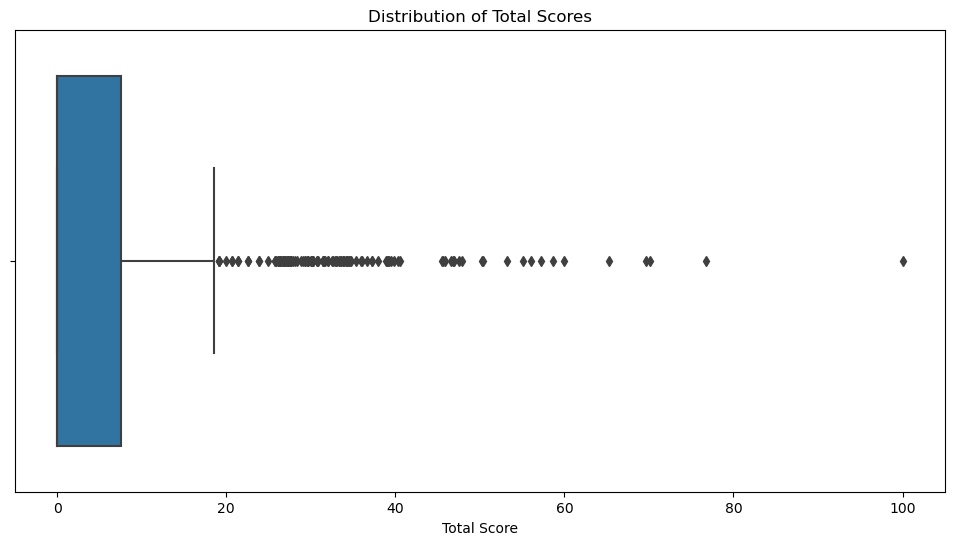

In [299]:
#Missleading visulaization for outliers
plt.figure(figsize=(12, 6))
sns.boxplot(x='Total Score', data=shanghai2022)
plt.title('Distribution of Total Scores')
plt.xlabel('Total Score')
plt.show()

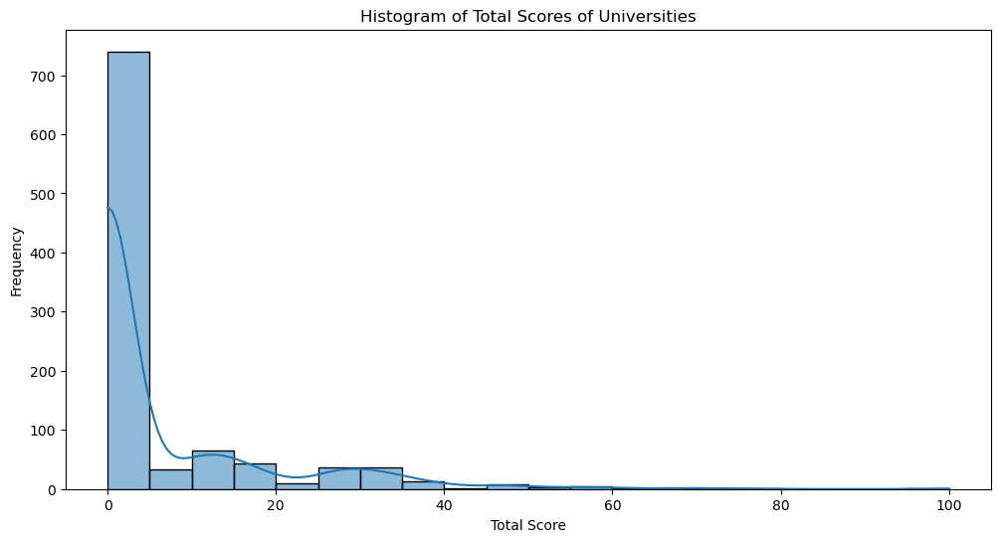

In [300]:
#Misleading for outliers
plt.figure(figsize=(12, 6))
sns.histplot(data=shanghai2022, x='Total Score', bins=20, kde=True)

plt.title('Histogram of Total Scores of Universities')
plt.xlabel('Total Score')
plt.ylabel('Frequency')

plt.show()

### Times Higher Education 2022

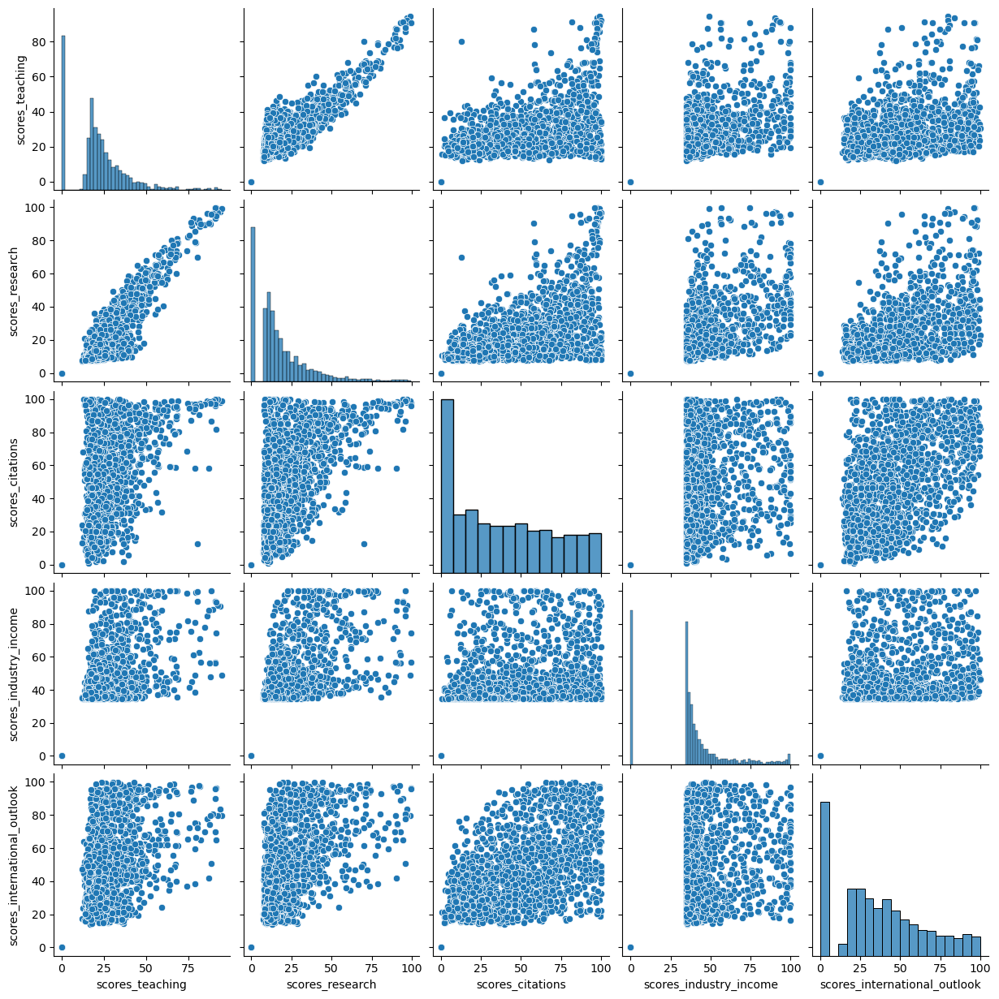

In [301]:
sns.pairplot(the2022[['scores_teaching', 'scores_research', 'scores_citations', 
                 'scores_industry_income', 'scores_international_outlook']])
plt.show()

## Visualizations & Answers

## Q1. Which universities are ranked in the top 10 globally?

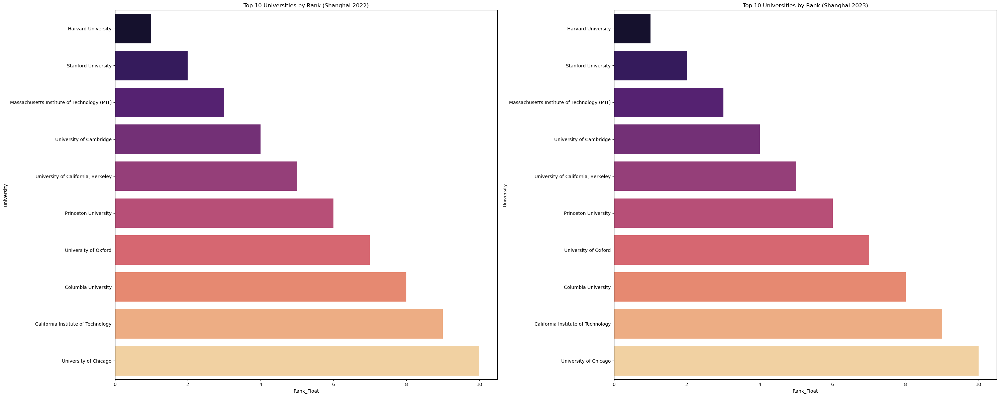

In [314]:
plt.figure(figsize=(30, 12))

# Process 2022 Shanghai Ranking Data
plt.subplot(1, 2, 1)
top_10_shanghai_22 = shanghai2022[['University Name', 'Rank_Float']].dropna().head(10)
top_10_shanghai_22['Rank_Float'] = top_10_shanghai_22['Rank_Float'].astype(int)
sns.barplot(x='Rank_Float', y='University Name', data=top_10_shanghai_22, palette='magma')
plt.xlabel("Rank_Float")
plt.ylabel("University")
plt.title("Top 10 Universities by Rank (Shanghai 2022)")

# Process 2023 Shanghai Ranking Data
plt.subplot(1, 2, 2)
top_10_shanghai_23 = shanghai2023[['Name', 'Rank_Float']].dropna().head(10)
top_10_shanghai_23['Rank_Float'] = top_10_shanghai_23['Rank_Float'].astype(int)
sns.barplot(x='Rank_Float', y='Name', data=top_10_shanghai_23, palette='magma')
plt.xlabel("Rank_Float")
plt.ylabel("University")
plt.title("Top 10 Universities by Rank (Shanghai 2023)")

plt.tight_layout()
plt.show()


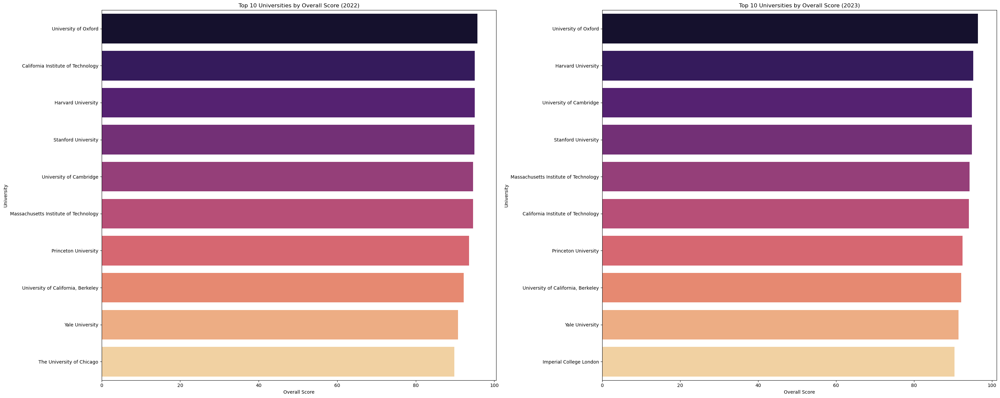

In [325]:
plt.figure(figsize=(30, 12))

# Process 2022 Data
plt.subplot(1, 2, 1)
top_10_22 = the2022[['name', 'scores_overall']].dropna().head(10)
top_10_22['scores_overall'] = top_10_22['scores_overall'].astype(float)
sns.barplot(x='scores_overall', y='name', data=top_10_22, palette='magma')
plt.xlabel("Overall Score")
plt.ylabel("University")
plt.title("Top 10 Universities by Overall Score (2022)")


# Process 2023 Data
plt.subplot(1, 2, 2)
top_10_23 = the2023[['name', 'scores_overall']].dropna().head(10)
top_10_23['scores_overall'] = top_10_23['scores_overall'].astype(float)
sns.barplot(x='scores_overall', y='name', data=top_10_23, palette='magma')
plt.xlabel("Overall Score")
plt.ylabel("University")
plt.title("Top 10 Universities by Overall Score (2023)")

plt.tight_layout()
plt.show()



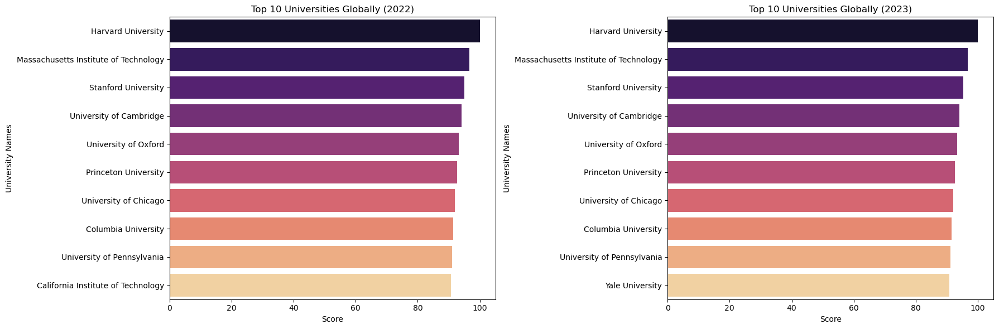

In [327]:
# Global Top 10 Universities for 2022 and 2023
plt.figure(figsize=(18, 6))

# Process 2022 Global Data
plt.subplot(1, 2, 1)
top_10_global_22 = cwur2022.sort_values(by='World Rank').head(10)
sns.barplot(x='Score', y='Univesity Names', data=top_10_global_22, palette='magma')
plt.xlabel("Score")
plt.ylabel("University Names")
plt.title("Top 10 Universities Globally (2022)")

# Process 2023 Global Data
plt.subplot(1, 2, 2)
top_10_global_23 = cwur2023.sort_values(by='World Rank').head(10)
sns.barplot(x='Score', y='University Names', data=top_10_global_23, palette='magma')
plt.xlabel("Score")
plt.ylabel("University Names")
plt.title("Top 10 Universities Globally (2023)")
plt.tight_layout()
plt.show()

## Q2. Which universities are ranked in the top 10 for employment outcomes?

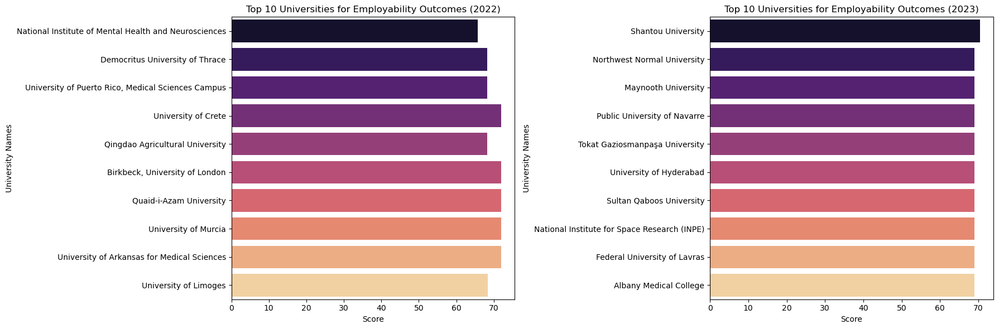

In [331]:
# Employability Top 10 Universities for 2022 and 2023
plt.figure(figsize=(18, 6))

# Process 2022 Employability Data
cwur2022['Employability Rank'] = pd.to_numeric(cwur2022['Employability Rank'], errors='coerce')
top_10_employability_22 = cwur2022.sort_values(by='Employability Rank').head(10)
plt.subplot(1, 2, 1)
sns.barplot(x='Score', y='Univesity Names', data=top_10_employability_22, palette='magma')
plt.xlabel("Score")
plt.ylabel("University Names")
plt.title("Top 10 Universities for Employability Outcomes (2022)")

# Process 2023 Employability Data
cwur2023['Employability Rank'] = pd.to_numeric(cwur2023['Employability Rank'], errors='coerce')
top_10_employability_23 = cwur2023.sort_values(by='Employability Rank').head(10)
plt.subplot(1, 2, 2)
sns.barplot(x='Score', y='University Names', data=top_10_employability_23, palette='magma')
plt.xlabel("Score")
plt.ylabel('University Names')
plt.title("Top 10 Universities for Employability Outcomes (2023)")

plt.tight_layout()
plt.show()

## Q3. What positions do universities in Saudi Arabia hold within the global rankings?


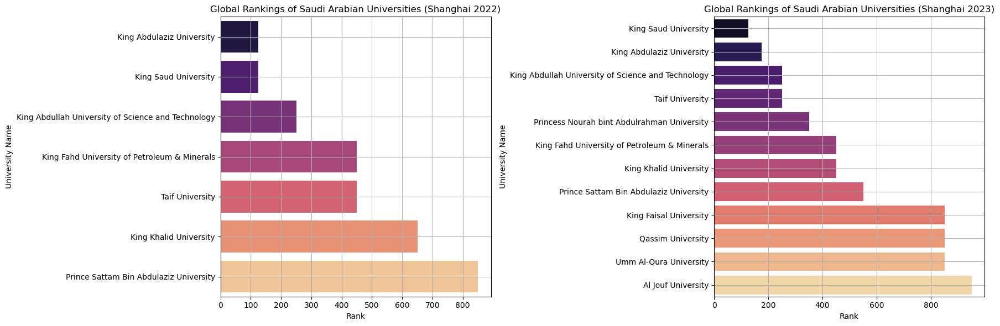

In [337]:
plt.figure(figsize=(18, 6))


# Process 2022 Saudi Universities Data
plt.subplot(1, 2, 1)
saudi_universities_22 = shanghai2022[shanghai2022['Country'] == ' Saudi Arabia'].sort_values(by='Rank')
sns.barplot(x= 'Rank_Float', y='University Name', data=saudi_universities_22, palette='magma')
plt.grid()
plt.xlabel("Rank")
plt.ylabel("University Name")
plt.title("Global Rankings of Saudi Arabian Universities (Shanghai 2022)")

# Process 2023 Saudi Universities Data
plt.subplot(1, 2, 2)
saudi_universities_23 = shanghai2023[shanghai2023['Country'] == ' Saudi Arabia'].sort_values(by='Rank')
sns.barplot(x='Rank_Float', y='Name', data=saudi_universities_23, palette='magma')
plt.grid()
plt.xlabel("Rank")
plt.ylabel("University Name")
plt.title("Global Rankings of Saudi Arabian Universities (Shanghai 2023)")

plt.tight_layout()
plt.show()



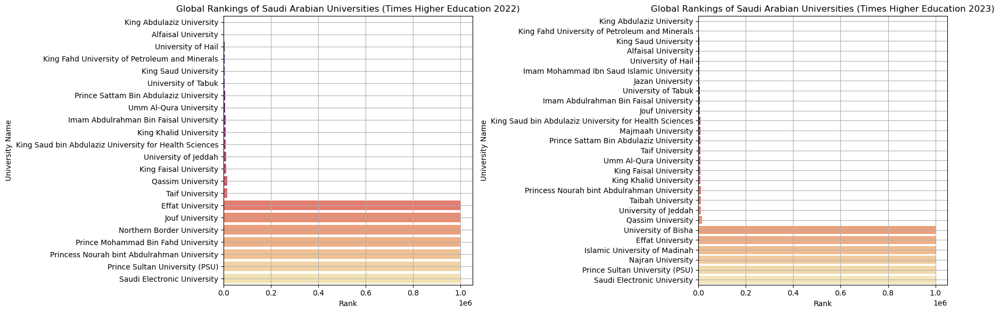

In [338]:
plt.figure(figsize=(18, 6))

# Process 2022 Saudi Universities Data
plt.subplot(1, 2, 1)
saudi_universities_22 = the2022[the2022['location'] == 'Saudi Arabia'].sort_values(by='rank_order')
sns.barplot(x='rank_order', y='name', data=saudi_universities_22, palette='magma')
plt.grid()
plt.xlabel("Rank")
plt.ylabel("University Name")
plt.title("Global Rankings of Saudi Arabian Universities (Times Higher Education 2022)")

# Process 2023 Saudi Universities Data
plt.subplot(1, 2, 2)
saudi_universities_23 = the2023[the2023['location'] == 'Saudi Arabia'].sort_values(by='rank_order')
sns.barplot(x='rank_order', y='name', data=saudi_universities_23, palette='magma')
plt.grid()
plt.xlabel("Rank")
plt.ylabel("University Name")
plt.title("Global Rankings of Saudi Arabian Universities (Times Higher Education 2023)")

plt.tight_layout()
plt.show()


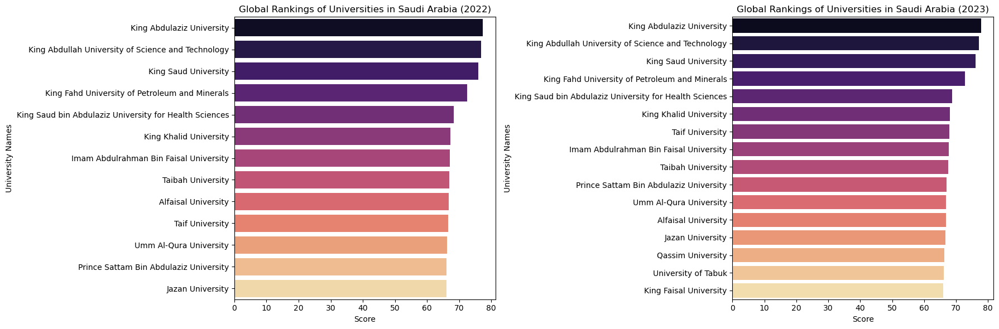

In [340]:
# Saudi Arabian Universities Global Rankings
plt.figure(figsize=(18, 6))

# Process 2022 Saudi Universities Data
plt.subplot(1, 2, 1)
saudi_universities_22 = cwur2022[cwur2022['Location'] == 'Saudi Arabia'].sort_values(by='World Rank')
sns.barplot(x='Score', y='Univesity Names', data=saudi_universities_22, palette='magma')
plt.xlabel("Score")
plt.ylabel("University Names")
plt.title("Global Rankings of Universities in Saudi Arabia (2022)")

# Process 2023 Saudi Universities Data
plt.subplot(1, 2, 2)
saudi_universities_23 = cwur2023[cwur2023['Location '] == 'Saudi Arabia'].sort_values(by='World Rank')
sns.barplot(x='Score', y='University Names', data=saudi_universities_23, palette='magma')
plt.xlabel("Score")
plt.ylabel("University Names")
plt.title("Global Rankings of Universities in Saudi Arabia (2023)")

plt.tight_layout()
plt.show()

## Q4. Considering various factors such as employment rankings, researchrankings, and others, which has the most significant impact on auniversity's overall ranking?

C:\Users\sakur\AppData\Local\Temp\ipykernel_17564\1744249665.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  factors_22[col] = pd.to_numeric(factors_22[col], errors='coerce')
C:\Users\sakur\AppData\Local\Temp\ipykernel_17564\1744249665.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  factors_23[col] = pd.to_numeric(factors_23[col], errors='coerce')


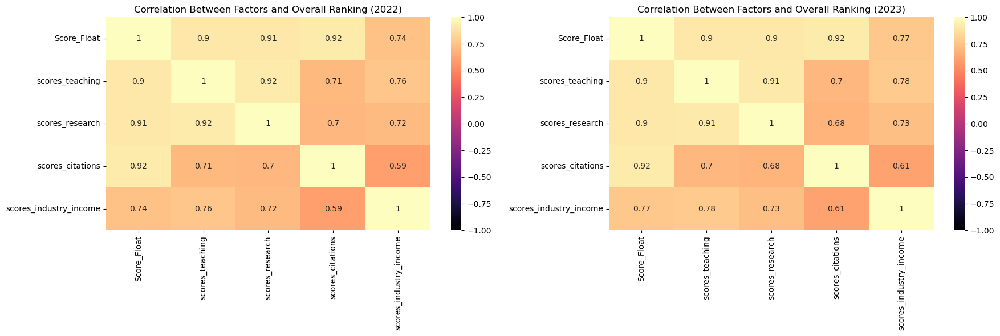

In [341]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Factors affecting university rankings for 2022
factors_22 = the2022[['Score_Float', 'scores_teaching', 'scores_research', 'scores_citations', 'scores_industry_income']]
for col in factors_22.columns[1:]:
    factors_22[col] = pd.to_numeric(factors_22[col], errors='coerce')
corr_22 = factors_22.corr()

# Factors affecting university rankings for 2023
factors_23 = the2023[['Score_Float', 'scores_teaching', 'scores_research', 'scores_citations', 'scores_industry_income']]
for col in factors_23.columns[1:]:
    factors_23[col] = pd.to_numeric(factors_23[col], errors='coerce')
corr_23 = factors_23.corr()

# Create heatmaps
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
sns.heatmap(corr_22, annot=True, cmap='magma', vmin=-1, vmax=1)
plt.title('Correlation Between Factors and Overall Ranking (2022)')

plt.subplot(1, 2, 2)
sns.heatmap(corr_23, annot=True, cmap='magma', vmin=-1, vmax=1)
plt.title('Correlation Between Factors and Overall Ranking (2023)')

plt.tight_layout()
plt.show()


C:\Users\sakur\AppData\Local\Temp\ipykernel_17564\1504092167.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  factors_22[col] = pd.to_numeric(factors_22[col], errors='coerce')
C:\Users\sakur\AppData\Local\Temp\ipykernel_17564\1504092167.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  factors_23[col] = pd.to_numeric(factors_23[col], errors='coerce')


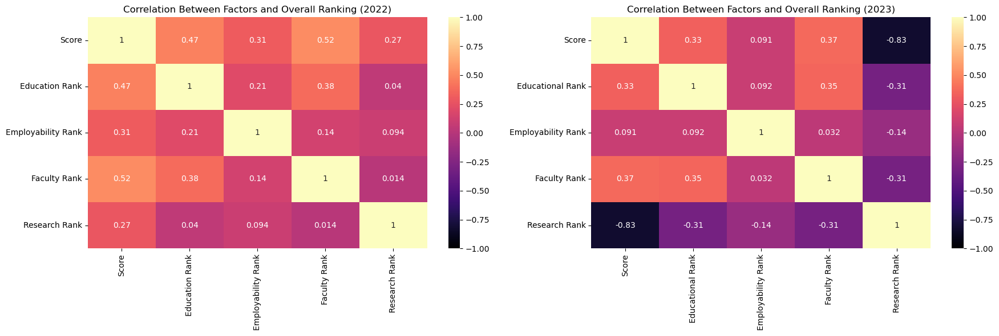

In [348]:
# Factors affecting university rankings for 2022
factors_22 = cwur2022[['Score', 'Education Rank', 'Employability Rank', 'Faculty Rank', 'Research Rank']]
for col in factors_22.columns[1:]:
    factors_22[col] = pd.to_numeric(factors_22[col], errors='coerce')
corr_22 = factors_22.corr()

# Factors affecting university rankings for 2023
factors_23 = cwur2023[['Score', 'Educational Rank', 'Employability Rank', 'Faculty Rank', 'Research Rank']]
for col in factors_23.columns[1:]:
    factors_23[col] = pd.to_numeric(factors_23[col], errors='coerce')
corr_23 = factors_23.corr()

# Create heatmaps
plt.figure(figsize=(18, 6))

plt.subplot(1, 2, 1)
sns.heatmap(corr_22, annot=True, cmap='magma', vmin=-1, vmax=1)
plt.title('Correlation Between Factors and Overall Ranking (2022)')

plt.subplot(1, 2, 2)
sns.heatmap(corr_23, annot=True, cmap='magma', vmin=-1, vmax=1)
plt.title('Correlation Between Factors and Overall Ranking (2023)')

plt.tight_layout()
plt.show()
# WordRank_university_rank23['']

## Q5. Is there a correlation between national and global university rankings, and based on this information, can you recommend a country that appears to have a high concentration of top-ranked universities?


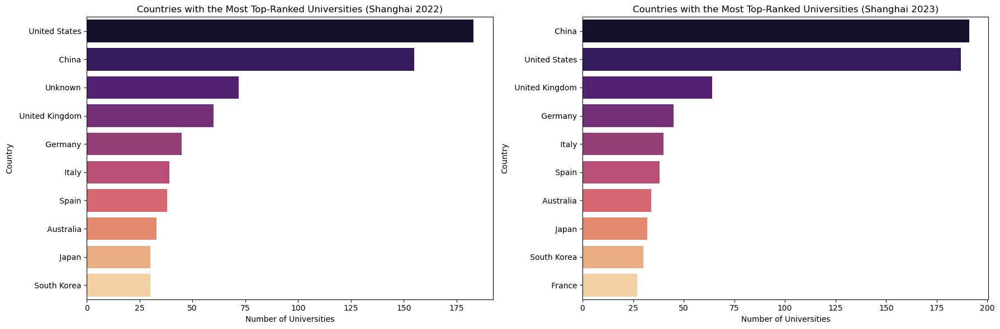

In [351]:
plt.figure(figsize=(18, 6))

# Process 2022 Data
plt.subplot(1, 2, 1)
top_countries_22 = shanghai2022['Country'].value_counts().head(10)
sns.barplot(x=top_countries_22.values, y=top_countries_22.index, palette='magma')
plt.xlabel("Number of Universities")
plt.ylabel("Country")
plt.title("Countries with the Most Top-Ranked Universities (Shanghai 2022)")

# Process 2023 Data
plt.subplot(1, 2, 2)
top_countries_23 = shanghai2023['Country'].value_counts().head(10)
sns.barplot(x=top_countries_23.values, y=top_countries_23.index, palette='magma')
plt.xlabel("Number of Universities")
plt.ylabel("Country")
plt.title("Countries with the Most Top-Ranked Universities (Shanghai 2023)")

plt.tight_layout()
plt.show()


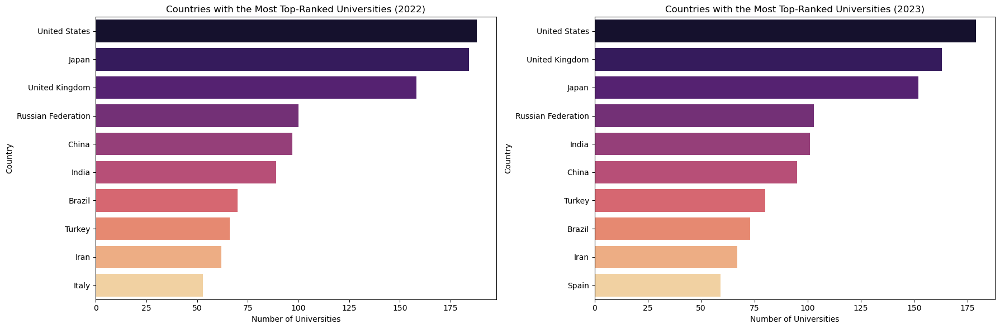

In [352]:
# Top 10 Countries with Most Top-Ranked Universities for 2022 and 2023
plt.figure(figsize=(18, 6))

# Process 2022 Data
plt.subplot(1, 2, 1)
top_countries_22 = the2022['location'].value_counts().head(10)
sns.barplot(x=top_countries_22.values, y=top_countries_22.index, palette='magma')
plt.xlabel("Number of Universities")
plt.ylabel("Country")
plt.title("Countries with the Most Top-Ranked Universities (2022)")

# Process 2023 Data
plt.subplot(1, 2, 2)
top_countries_23 = the2023['location'].value_counts().head(10)
sns.barplot(x=top_countries_23.values, y=top_countries_23.index, palette='magma')
plt.xlabel("Number of Universities")
plt.ylabel("Country")
plt.title("Countries with the Most Top-Ranked Universities (2023)")

plt.tight_layout()
plt.show()


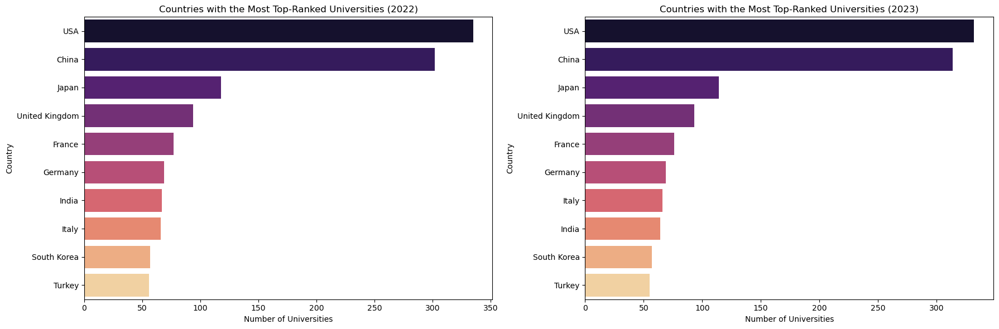

In [354]:
# Top 10 Countries with Most Top-Ranked Universities for 2022 and 2023
plt.figure(figsize=(18, 6))

# Process 2022 Data
plt.subplot(1, 2, 1)
top_countries_22 = cwur2022['Location'].value_counts().head(10)
sns.barplot(x=top_countries_22.values, y=top_countries_22.index, palette='magma')
plt.xlabel("Number of Universities")
plt.ylabel("Country")
plt.title("Countries with the Most Top-Ranked Universities (2022)")

# Process 2023 Data
plt.subplot(1, 2, 2)
top_countries_23 = cwur2023['Location '].value_counts().head(10)
sns.barplot(x=top_countries_23.values, y=top_countries_23.index, palette='magma')
plt.xlabel("Number of Universities")
plt.ylabel("Country")
plt.title("Countries with the Most Top-Ranked Universities (2023)")

plt.tight_layout()
plt.show()

## Q6 bonus: Are there any universities that have stayed in the same position in both 2022 and 2023?


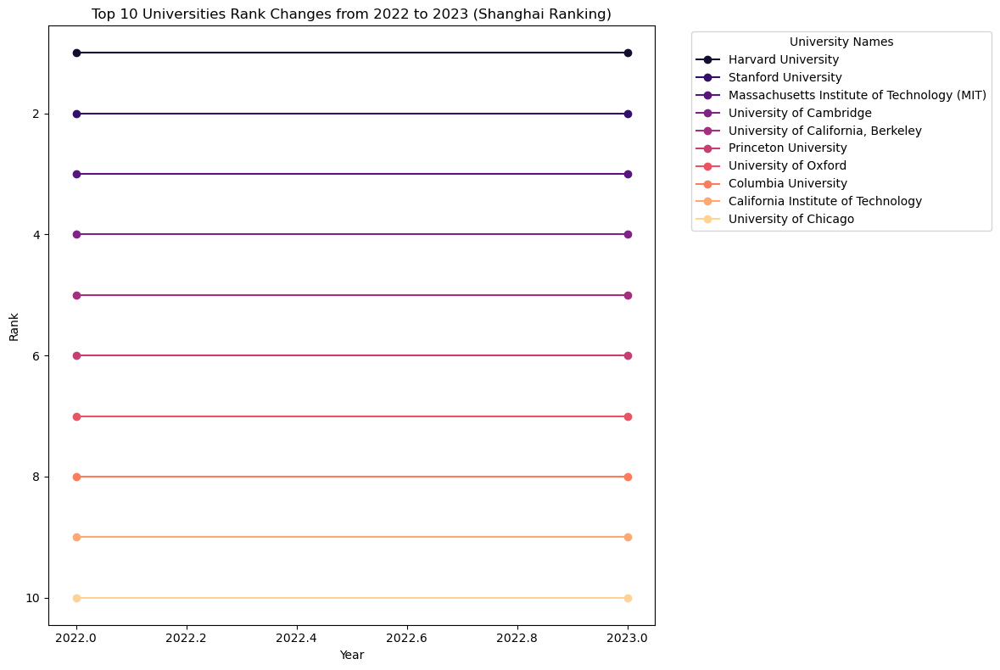

In [359]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Filter out rows where Rank_Float is 0.0 and store in new DataFrames
filtered_shanghai22 = shanghai2022[shanghai2022['Rank_Float'] > 0]
filtered_shanghai23 = shanghai2023[shanghai2023['Rank_Float'] > 0]

# Get top 10 universities for 2022 and 2023 from the filtered DataFrames
top_10_universities_22 = filtered_shanghai22[['Rank_Float', 'University Name']].sort_values(by='Rank_Float').head(10)
top_10_universities_23 = filtered_shanghai23[['Rank_Float', 'Name']].sort_values(by='Rank_Float').head(10)

# Rename the columns to match for merging
top_10_universities_22.rename(columns={'University Name': 'name'}, inplace=True)
top_10_universities_23.rename(columns={'Name': 'name'}, inplace=True)

# Merge the datasets on university name to get a unified view of both years, keeping universities that appear in both years
top_10_universities = pd.merge(top_10_universities_22, top_10_universities_23, on='name', suffixes=('_22', '_23'))

# Get magma color palette for the top 10 universities
colors = sns.color_palette("magma", len(top_10_universities))

# Plot
plt.figure(figsize=(12, 8))

# Loop through top 10 universities and plot their ranking changes over time
for index, row in top_10_universities.iterrows():
    plt.plot([2022, 2023], [row['Rank_Float_22'], row['Rank_Float_23']], marker='o', label=row['name'], color=colors[index])

# Invert y-axis to show rank 1 at the top
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Rank")
plt.title("Top 10 Universities Rank Changes from 2022 to 2023 (Shanghai Ranking)")

# Add the legend with proper labels
plt.legend(title="University Names", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

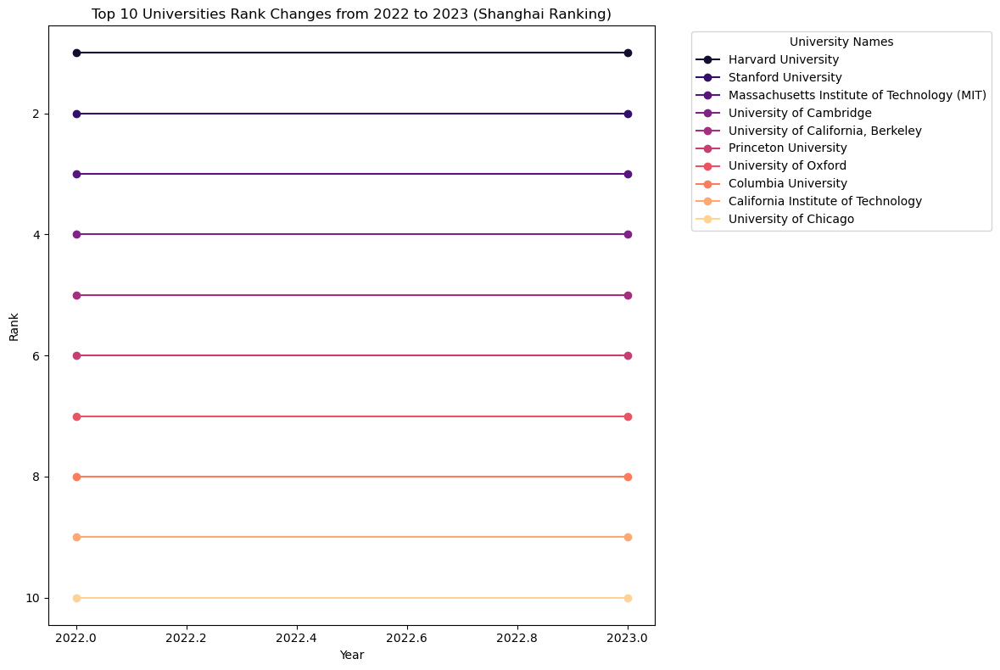

In [358]:
# Filter out rows where Rank_Float is 0.0 and store in new DataFrames
filtered_shanghai22 = shanghai2022[shanghai2022['Rank_Float'] > 0]
filtered_shanghai23 = shanghai2023[shanghai2023['Rank_Float'] > 0]

# Get top 10 universities for 2022 and 2023 from the filtered DataFrames
top_10_universities_22 = filtered_shanghai22[['Rank_Float', 'University Name']].sort_values(by='Rank_Float').head(10)
top_10_universities_23 = filtered_shanghai23[['Rank_Float', 'Name']].sort_values(by='Rank_Float').head(10)

# Rename the columns to match for merging
top_10_universities_22.rename(columns={'University Name': 'name'}, inplace=True)
top_10_universities_23.rename(columns={'Name': 'name'}, inplace=True)

# Merge the datasets on university name to get a unified view of both years, keeping universities that appear in both years
top_10_universities = pd.merge(top_10_universities_22, top_10_universities_23, on='name', suffixes=('_22', '_23'))

# Get magma color palette for the top 10 universities
colors = sns.color_palette("magma", len(top_10_universities))

# Plot
plt.figure(figsize=(12, 8))

# Loop through top 10 universities and plot their ranking changes over time
for index, row in top_10_universities.iterrows():
    plt.plot([2022, 2023], [row['Rank_Float_22'], row['Rank_Float_23']], marker='o', label=row['name'], color=colors[index])

# Invert y-axis to show rank 1 at the top
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Rank")
plt.title("Top 10 Universities Rank Changes from 2022 to 2023 (Shanghai Ranking)")

# Add the legend with proper labels
plt.legend(title="University Names", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


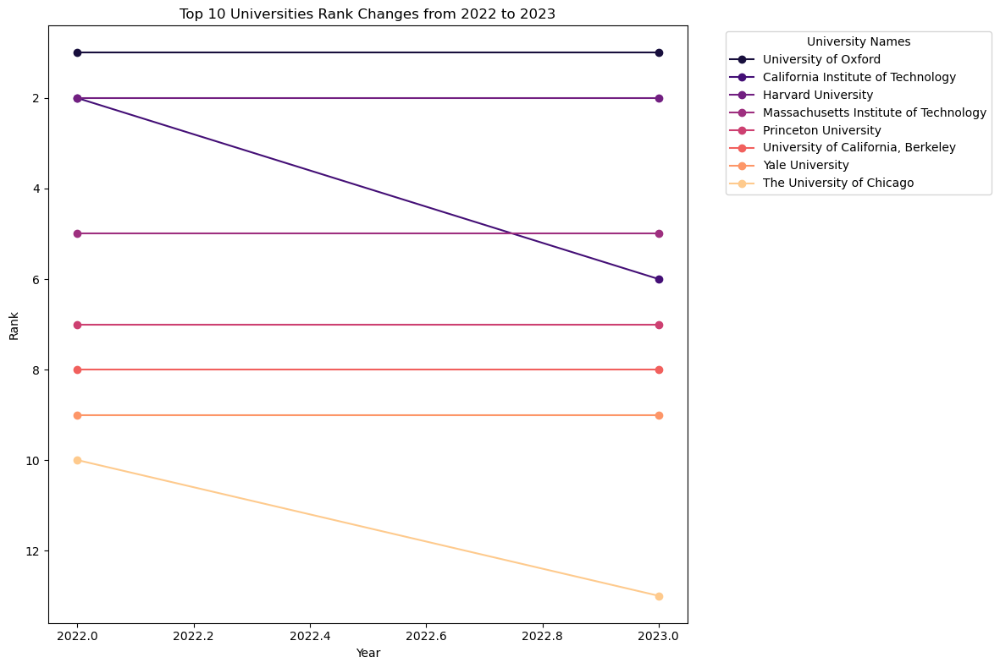

In [361]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Filter out rows where Rank_Float is 0.0 and store in new DataFrames
filtered_rank22 = the2022[the2022['Rank_Float'] > 0]
filtered_rank23 = the2023[the2023['Rank_Float'] > 0]

# Get top 10 universities for 2022 and 2023 from the filtered DataFrames
top_10_universities_22 = filtered_rank22[['Rank_Float', 'name']].sort_values(by='Rank_Float').head(10)
top_10_universities_23 = filtered_rank23[['Rank_Float', 'name']].sort_values(by='Rank_Float').head(10)

# Merge the datasets on university name to get a unified view of both years
top_10_universities = pd.merge(top_10_universities_22, top_10_universities_23, on='name', suffixes=('_22', '_23'))

# Get magma color palette for the top 10 universities
colors = sns.color_palette("magma", len(top_10_universities))

# Plot
plt.figure(figsize=(12, 8))

# Loop through top 10 universities and plot their ranking changes over time
for index, row in top_10_universities.iterrows():
    plt.plot([2022, 2023], [row['Rank_Float_22'], row['Rank_Float_23']], marker='o', label=row['name'], color=colors[index])

# Invert y-axis to show rank 1 at the top
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Rank")
plt.title("Top 10 Universities Rank Changes from 2022 to 2023")

# Add the legend with proper labels
plt.legend(title="University Names", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


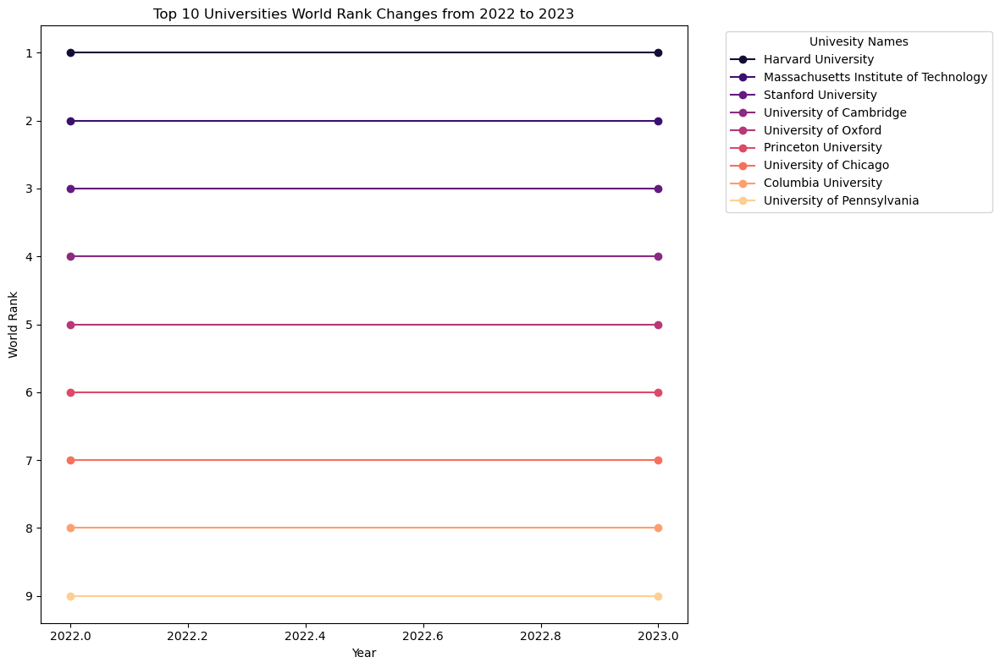

In [366]:
#Sort and get top 10 universities by World Rank for 2022 and 2023
top_10_universities_22 = cwur2022[['World Rank', 'Univesity Names']].sort_values(by='World Rank').head(10)
top_10_universities_23 = cwur2023[['World Rank', 'University Names']].sort_values(by='World Rank').head(10)

#Rename 'University Names' to 'name' for consistency when merging
top_10_universities_22.rename(columns={'Univesity Names': 'name'}, inplace=True)
top_10_universities_23.rename(columns={'University Names': 'name'}, inplace=True)

#Merge both years' data to have a unified dataframe with rankings across both years
top_10_universities = pd.merge(top_10_universities_22, top_10_universities_23, on='name', suffixes=('_22', '_23'))

colors = sns.color_palette("magma", len(top_10_universities))

#Plot
plt.figure(figsize=(12, 8))

#Loop through top 10 universities and plot their ranking changes over time
for index, row in top_10_universities.iterrows():
    plt.plot([2022, 2023], [row['World Rank_22'], row['World Rank_23']], marker='o', label=row['name'],
            color=colors[index])

#Add labels and title
plt.xlabel("Year")
plt.ylabel("World Rank")
plt.title("Top 10 Universities World Rank Changes from 2022 to 2023")

#Invert y-axis to show rank 1 at the top
plt.gca().invert_yaxis()

#dd the legend with proper labels
plt.legend(title="Univesity Names", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

## Q7 bouns: Which university experienced the most significant decline in its global ranking from 2022 to 2023?

The university with the most significant decline is California Institute of Technology with a rank decline of 4.0.


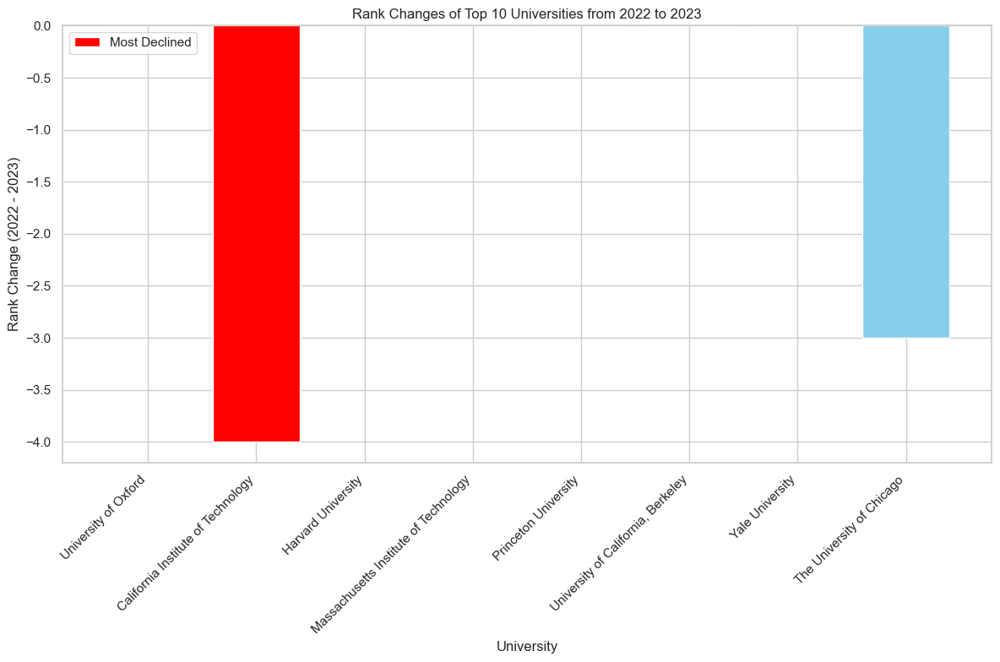

In [379]:
#Filter out rows where Rank_Float is 0.0 and store in new DataFrames
filtered_rank22 = the2022[the2022['Rank_Float'] > 0]
filtered_rank23 = the2023[the2023['Rank_Float'] > 0]

#Get top 10 universities for 2022 and 2023 from the filtered DataFrames
top_10_universities_22 = filtered_rank22[['Rank_Float', 'name']].sort_values(by='Rank_Float').head(10)
top_10_universities_23 = filtered_rank23[['Rank_Float', 'name']].sort_values(by='Rank_Float').head(10)

#Merge the datasets on university name to get a unified view of both years
top_10_universities = pd.merge(top_10_universities_22, top_10_universities_23, on='name', suffixes=('_22', '_23'))

#Calculate rank change (improvement or decline)
top_10_universities['Rank_Change'] = top_10_universities['Rank_Float_22'] - top_10_universities['Rank_Float_23']

#Find the university with the most significant decline
most_declined_university = top_10_universities.loc[top_10_universities['Rank_Change'].idxmin()]

#Print the result
print(f"The university with the most significant decline is {most_declined_university['name']} with a rank decline of {abs(most_declined_university['Rank_Change'])}.")

#Plot rank changes
plt.figure(figsize=(12, 8))
plt.bar(top_10_universities['name'], top_10_universities['Rank_Change'], color='skyblue')

#Highlight the most declined university
plt.bar(most_declined_university['name'], most_declined_university['Rank_Change'], color='red', label='Most Declined')

#Add labels and title
plt.xlabel("University")
plt.ylabel("Rank Change (2022 - 2023)")
plt.title("Rank Changes of Top 10 Universities from 2022 to 2023")

#Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

#Add legend
plt.legend()

#Show the plot
plt.tight_layout()
plt.show()